# Baby Cry Sense Dataset -- Exploratory Data Analysis

## Dataset Overview

The Baby Cry Sense Dataset contains 1126 categorized audio recordings of infant cries
distributed across 8 classes. The goal of this EDA is to understand the structure,
distribution, audio characteristics, and feature separability of the dataset before
building any classification model.

### Categories and File Counts
| Category    | Files |
|-------------|-------|
| Belly Pain  | 133   |
| Burping     | 124   |
| Cold/Hot    | 130   |
| Discomfort  | 142   |
| Hungry      | 397   |
| Lonely      | 25    |
| Scared      | 33    |
| Tired       | 142   |

Total size: 234.62 MB

## 1. Imports and Setup

In [146]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
import IPython.display as ipd
from collections import Counter
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 11

print("All libraries imported successfully.")

All libraries imported successfully.


## 2. Data Loading and Metadata Construction

Walk through all subdirectories, collect file paths, names, categories,
formats, and file sizes into a single DataFrame.

In [147]:

from google.colab import drive
drive.mount('/content/drive')

DATASET_PATH = "/content/drive/MyDrive/BabyCryDataset"

print(os.listdir(DATASET_PATH))

# DATASET_PATH = "vikaseranki9/baby-cry-sense-dataset"

data_records = []

for category_name in sorted(os.listdir(DATASET_PATH)):
    category_path = os.path.join(DATASET_PATH, category_name)
    if not os.path.isdir(category_path):
        continue
    for file_name in os.listdir(category_path):
        file_path = os.path.join(category_path, file_name)
        if not os.path.isfile(file_path):
            continue
        file_ext = os.path.splitext(file_name)[1].lower()
        file_size_kb = os.path.getsize(file_path) / 1024.0
        data_records.append({
            'file_path': file_path,
            'file_name': file_name,
            'category': category_name,
            'format': file_ext,
            'file_size_KB': round(file_size_kb, 2)
        })

df_meta = pd.DataFrame(data_records)
print(f"Total files found: {len(df_meta)}")
df_meta.head(10)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['lonely', 'hungry', 'belly pain', 'burping', 'scared', 'tired', 'cold_hot', 'discomfort']
Total files found: 1126


,file_path,file_name,category,format,file_size_KB
0,/content/drive/MyDrive/BabyCryDataset/belly pa...,382c.wav,belly pain,.wav,109.45
1,/content/drive/MyDrive/BabyCryDataset/belly pa...,376c.wav,belly pain,.wav,109.45
2,/content/drive/MyDrive/BabyCryDataset/belly pa...,407c.wav,belly pain,.wav,861.38
3,/content/drive/MyDrive/BabyCryDataset/belly pa...,385c.wav,belly pain,.wav,109.45
4,/content/drive/MyDrive/BabyCryDataset/belly pa...,395c.wav,belly pain,.wav,109.45
5,/content/drive/MyDrive/BabyCryDataset/belly pa...,359c.wav,belly pain,.wav,109.45
6,/content/drive/MyDrive/BabyCryDataset/belly pa...,392c.wav,belly pain,.wav,109.45
7,/content/drive/MyDrive/BabyCryDataset/belly pa...,400c.wav,belly pain,.wav,109.45
8,/content/drive/MyDrive/BabyCryDataset/belly pa...,375c.wav,belly pain,.wav,109.45
9,/content/drive/MyDrive/BabyCryDataset/belly pa...,370c.wav,belly pain,.wav,109.45


## 3. Basic Dataset Statistics

In [148]:
print("=" * 60)
print("BASIC DATASET STATISTICS")
print("=" * 60)

print(f"\nTotal audio files: {len(df_meta)}")
print(f"Number of categories: {df_meta['category'].nunique()}")
print(f"Categories: {sorted(df_meta['category'].unique())}")
print(f"\nTotal dataset size: {df_meta['file_size_KB'].sum() / 1024:.2f} MB")
print(f"Average file size: {df_meta['file_size_KB'].mean():.2f} KB")
print(f"Median file size: {df_meta['file_size_KB'].median():.2f} KB")
print(f"Min file size: {df_meta['file_size_KB'].min():.2f} KB")
print(f"Max file size: {df_meta['file_size_KB'].max():.2f} KB")

BASIC DATASET STATISTICS

Total audio files: 1126
Number of categories: 8
Categories: ['belly pain', 'burping', 'cold_hot', 'discomfort', 'hungry', 'lonely', 'scared', 'tired']

Total dataset size: 223.75 MB
Average file size: 203.48 KB
Median file size: 108.83 KB
Min file size: 11.05 KB
Max file size: 1504.04 KB


In [149]:
# Files per category
print("\nFiles per category:")
print("-" * 40)
category_counts = df_meta['category'].value_counts().sort_values(ascending=False)
for cat, count in category_counts.items():
    pct = count / len(df_meta) * 100
    print(f"  {cat:15s}: {count:4d} files  ({pct:5.1f}%)")


Files per category:
----------------------------------------
  hungry         :  397 files  ( 35.3%)
  discomfort     :  142 files  ( 12.6%)
  tired          :  142 files  ( 12.6%)
  belly pain     :  133 files  ( 11.8%)
  cold_hot       :  130 files  ( 11.5%)
  burping        :  124 files  ( 11.0%)
  scared         :   33 files  (  2.9%)
  lonely         :   25 files  (  2.2%)


In [150]:
# File format distribution
print("\nFile format distribution:")
print("-" * 40)
format_counts = df_meta['format'].value_counts()
for fmt, count in format_counts.items():
    print(f"  {fmt:6s}: {count:4d} files")


File format distribution:
----------------------------------------
  .wav  : 1039 files
  .3gp  :   72 files
  .ogg  :    8 files
  .mp3  :    7 files


In [151]:
# Check for potentially corrupted or empty files
empty_files = df_meta[df_meta['file_size_KB'] < 1.0]
print(f"\nFiles smaller than 1 KB (potentially corrupted): {len(empty_files)}")
if len(empty_files) > 0:
    print(empty_files[['file_name', 'category', 'file_size_KB']])


Files smaller than 1 KB (potentially corrupted): 0


In [152]:
# File size statistics per category
print("\nFile size statistics per category (in KB):")
print("-" * 70)
size_stats = df_meta.groupby('category')['file_size_KB'].agg(
    ['count', 'mean', 'median', 'std', 'min', 'max']
).round(2)
print(size_stats.to_string())


File size statistics per category (in KB):
----------------------------------------------------------------------
            count    mean   median     std    min      max
category                                                  
belly pain    133  336.56   109.45  352.23  11.39   861.38
burping       124  358.84   108.20  409.79  11.05  1486.04
cold_hot      130  155.52   108.67  247.42  11.60  1188.71
discomfort    142  128.56   109.45  157.96  11.23  1199.04
hungry        397  106.61   108.51   27.19  11.39   406.41
lonely         25  575.49   406.57  564.59  11.60  1199.04
scared         33  773.08  1174.89  613.02  11.39  1504.04
tired         142  134.97   109.45  182.23  11.42  1199.04


## 4. Class Distribution Analysis

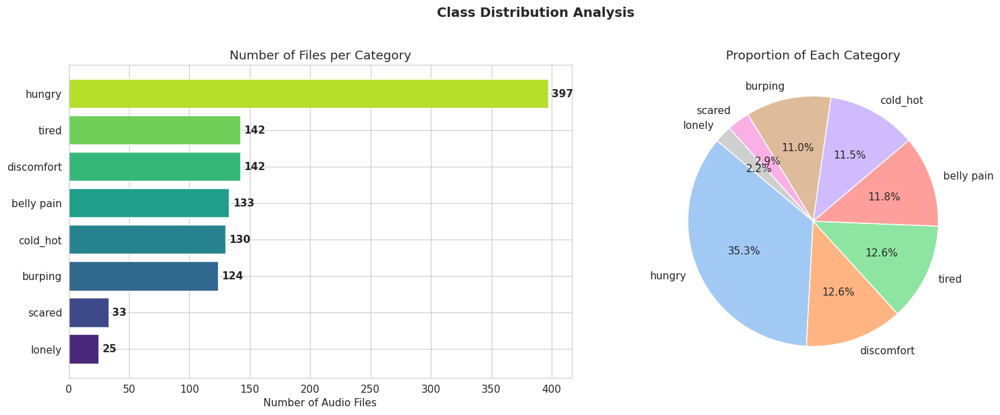

In [153]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
category_counts_sorted = df_meta['category'].value_counts().sort_values(ascending=True)
colors = sns.color_palette('viridis', n_colors=len(category_counts_sorted))
bars = axes[0].barh(category_counts_sorted.index, category_counts_sorted.values, color=colors)
axes[0].set_xlabel('Number of Audio Files')
axes[0].set_title('Number of Files per Category')
for bar, val in zip(bars, category_counts_sorted.values):
    axes[0].text(val + 3, bar.get_y() + bar.get_height() / 2,
                 str(val), va='center', fontweight='bold')

# Pie chart
category_counts_desc = df_meta['category'].value_counts()
axes[1].pie(category_counts_desc.values, labels=category_counts_desc.index,
            autopct='%1.1f%%', startangle=140,
            colors=sns.color_palette('pastel', n_colors=len(category_counts_desc)))
axes[1].set_title('Proportion of Each Category')

plt.suptitle('Class Distribution Analysis', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [154]:
# Imbalance analysis
max_class = category_counts.idxmax()
min_class = category_counts.idxmin()
imbalance_ratio = category_counts.max() / category_counts.min()

print("CLASS IMBALANCE ANALYSIS")
print("=" * 50)
print(f"Largest class:  {max_class} ({category_counts.max()} files)")
print(f"Smallest class: {min_class} ({category_counts.min()} files)")
print(f"Imbalance ratio: {imbalance_ratio:.1f}:1")
print(f"\nThis level of imbalance will require attention during")
print(f"model training (e.g., class weights, oversampling, or augmentation).")

CLASS IMBALANCE ANALYSIS
Largest class:  hungry (397 files)
Smallest class: lonely (25 files)
Imbalance ratio: 15.9:1

This level of imbalance will require attention during
model training (e.g., class weights, oversampling, or augmentation).


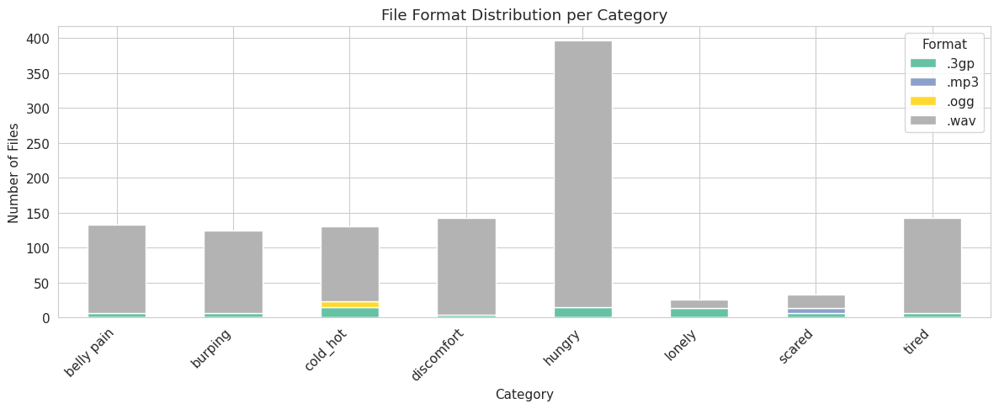

In [155]:
# File format distribution per category
fig, ax = plt.subplots(figsize=(12, 5))
format_by_cat = df_meta.groupby(['category', 'format']).size().unstack(fill_value=0)
format_by_cat.plot(kind='bar', stacked=True, ax=ax, colormap='Set2')
ax.set_title('File Format Distribution per Category')
ax.set_xlabel('Category')
ax.set_ylabel('Number of Files')
ax.legend(title='Format')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## 5. Audio Feature Extraction

Load each audio file using librosa and extract fundamental audio properties:
- Sample rate
- Duration
- Number of samples
- RMS energy
- Zero crossing rate
- Maximum and mean amplitude

This step may take a few minutes for 1126 files.

In [156]:
audio_features = []
failed_files = []

for idx, row in tqdm(df_meta.iterrows(), total=len(df_meta), desc="Extracting audio features"):
    try:
        y, sr = librosa.load(row['file_path'], sr=None, mono=True)
        duration = librosa.get_duration(y=y, sr=sr)
        rms = float(np.mean(librosa.feature.rms(y=y)))
        zcr = float(np.mean(librosa.feature.zero_crossing_rate(y=y)))
        max_amp = float(np.max(np.abs(y)))
        mean_amp = float(np.mean(np.abs(y)))

        audio_features.append({
            'file_name': row['file_name'],
            'category': row['category'],
            'file_path': row['file_path'],
            'sample_rate': sr,
            'duration_sec': round(duration, 3),
            'num_samples': len(y),
            'rms_energy': round(rms, 6),
            'zero_crossing_rate': round(zcr, 6),
            'max_amplitude': round(max_amp, 4),
            'mean_amplitude': round(mean_amp, 6),
        })
    except Exception as e:
        failed_files.append({'file': row['file_path'], 'error': str(e)})

df_audio = pd.DataFrame(audio_features)
print(f"\nSuccessfully loaded: {len(df_audio)} files")
print(f"Failed to load: {len(failed_files)} files")

if failed_files:
    print("\nFailed files:")
    for f in failed_files:
        print(f"  {f['file']}: {f['error']}")

Extracting audio features: 100%|██████████| 1126/1126 [00:38<00:00, 29.12it/s]


Successfully loaded: 1126 files
Failed to load: 0 files


In [157]:
df_audio.describe().round(4)

,sample_rate,duration_sec,num_samples,rms_energy,zero_crossing_rate,max_amplitude,mean_amplitude
count,1126.0000,1126.0000,1126.0000,1126.0000,1126.0000,1126.0000,1126.0000
mean,12424.3339,6.7836,80123.4680,0.0751,0.2327,0.6381,0.0573
std,11843.4917,0.5304,68516.5832,0.0635,0.1014,0.3101,0.0502
min,8000.0000,4.1270,52160.0000,0.0004,0.0201,0.0043,0.0003
25%,8000.0000,6.8400,55200.0000,0.0238,0.1745,0.3825,0.0176
50%,8000.0000,6.9200,55680.0000,0.0585,0.2285,0.6805,0.0433
75%,8000.0000,7.0000,56000.0000,0.1117,0.2944,0.9466,0.0849
max,44100.0000,8.7310,385024.0000,0.3802,0.5504,1.0174,0.3041


## 6. Duration Analysis

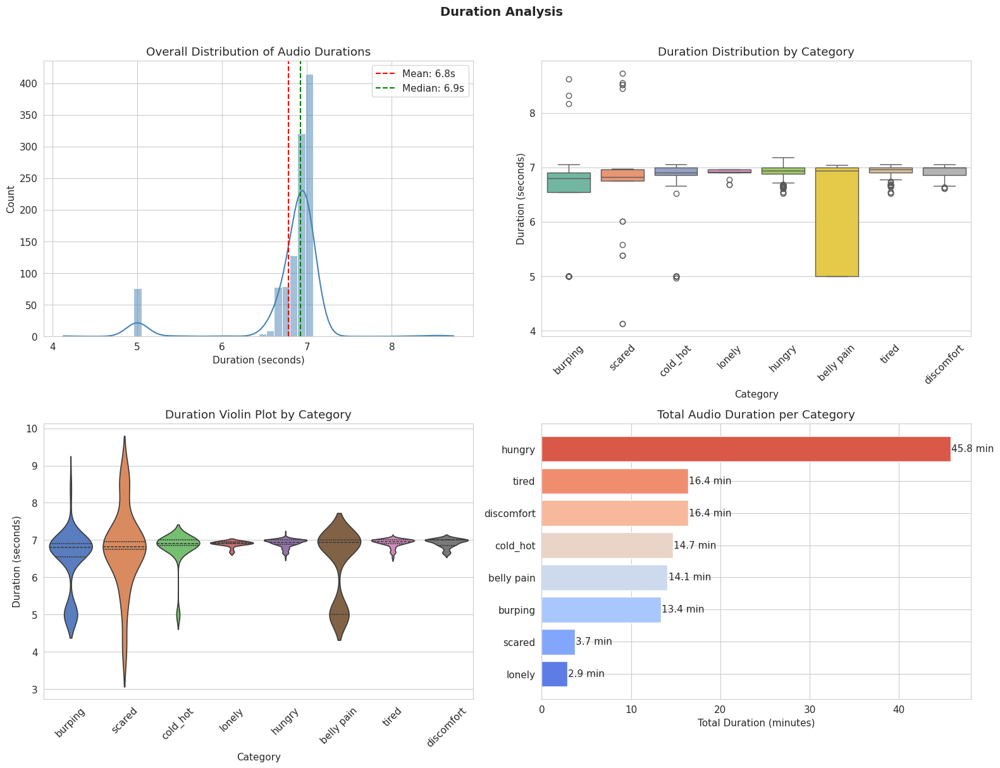

In [158]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 6.1 Overall duration distribution
sns.histplot(df_audio['duration_sec'], bins=50, kde=True, color='steelblue', ax=axes[0, 0])
axes[0, 0].axvline(df_audio['duration_sec'].mean(), color='red', linestyle='--',
                    label=f"Mean: {df_audio['duration_sec'].mean():.1f}s")
axes[0, 0].axvline(df_audio['duration_sec'].median(), color='green', linestyle='--',
                    label=f"Median: {df_audio['duration_sec'].median():.1f}s")
axes[0, 0].set_title('Overall Distribution of Audio Durations')
axes[0, 0].set_xlabel('Duration (seconds)')
axes[0, 0].set_ylabel('Count')
axes[0, 0].legend()

# 6.2 Box plot by category
order = df_audio.groupby('category')['duration_sec'].median().sort_values().index
sns.boxplot(data=df_audio, x='category', y='duration_sec', palette='Set2',
            order=order, ax=axes[0, 1])
axes[0, 1].set_title('Duration Distribution by Category')
axes[0, 1].set_xlabel('Category')
axes[0, 1].set_ylabel('Duration (seconds)')
axes[0, 1].tick_params(axis='x', rotation=45)

# 6.3 Violin plot by category
sns.violinplot(data=df_audio, x='category', y='duration_sec', palette='muted',
               order=order, ax=axes[1, 0], inner='quartile')
axes[1, 0].set_title('Duration Violin Plot by Category')
axes[1, 0].set_xlabel('Category')
axes[1, 0].set_ylabel('Duration (seconds)')
axes[1, 0].tick_params(axis='x', rotation=45)

# 6.4 Total duration per category
total_dur = df_audio.groupby('category')['duration_sec'].sum().sort_values()
bars = axes[1, 1].barh(total_dur.index, total_dur.values / 60, color=sns.color_palette('coolwarm', 8))
axes[1, 1].set_title('Total Audio Duration per Category')
axes[1, 1].set_xlabel('Total Duration (minutes)')
for bar, val in zip(bars, total_dur.values / 60):
    axes[1, 1].text(val + 0.1, bar.get_y() + bar.get_height() / 2,
                     f"{val:.1f} min", va='center')

plt.suptitle('Duration Analysis', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

In [159]:
# Duration statistics per category
print("Duration Statistics per Category (seconds)")
print("=" * 75)
dur_stats = df_audio.groupby('category')['duration_sec'].agg(
    ['count', 'mean', 'median', 'std', 'min', 'max', 'sum']
).round(2)
dur_stats.columns = ['Count', 'Mean', 'Median', 'Std', 'Min', 'Max', 'Total']
print(dur_stats.to_string())

Duration Statistics per Category (seconds)
            Count  Mean  Median   Std   Min   Max    Total
category                                                  
belly pain    133  6.36    6.94  0.91  5.00  7.04   845.22
burping       124  6.46    6.80  0.82  5.00  8.63   801.62
cold_hot      130  6.79    6.91  0.47  4.96  7.06   882.43
discomfort    142  6.92    7.00  0.12  6.62  7.06   983.26
hungry        397  6.92    6.94  0.11  6.52  7.18  2746.72
lonely         25  6.90    6.92  0.08  6.68  6.96   172.52
scared         33  6.77    6.82  1.07  4.13  8.73   223.29
tired         142  6.92    6.96  0.11  6.52  7.06   983.30


### 6.1 Duration Percentile Analysis and Target Duration Decision

To design a fixed-length input pipeline for the model, we need to
choose a target duration. Files shorter than the target will be
zero-padded; files longer will be truncated. The choice must balance
retaining audio content against excessive padding for short files.

In [160]:
# Compute duration percentiles
percentiles = [0.25, 0.50, 0.75, 0.90, 0.95, 0.99, 1.00]
duration_percentiles = df_audio['duration_sec'].quantile(percentiles)

print("DURATION PERCENTILE ANALYSIS")
print("=" * 50)
for p, val in duration_percentiles.items():
    pct_label = f"{int(p * 100)}th percentile"
    print(f"  {pct_label:>18s}: {val:.2f} seconds")

print(f"\n  Mean:   {df_audio['duration_sec'].mean():.2f} seconds")
print(f"  Std:    {df_audio['duration_sec'].std():.2f} seconds")
print(f"  Min:    {df_audio['duration_sec'].min():.2f} seconds")
print(f"  Max:    {df_audio['duration_sec'].max():.2f} seconds")

DURATION PERCENTILE ANALYSIS
     25th percentile: 6.84 seconds
     50th percentile: 6.92 seconds
     75th percentile: 7.00 seconds
     90th percentile: 7.00 seconds
     95th percentile: 7.02 seconds
     99th percentile: 7.06 seconds
    100th percentile: 8.73 seconds

  Mean:   6.78 seconds
  Std:    0.53 seconds
  Min:    4.13 seconds
  Max:    8.73 seconds


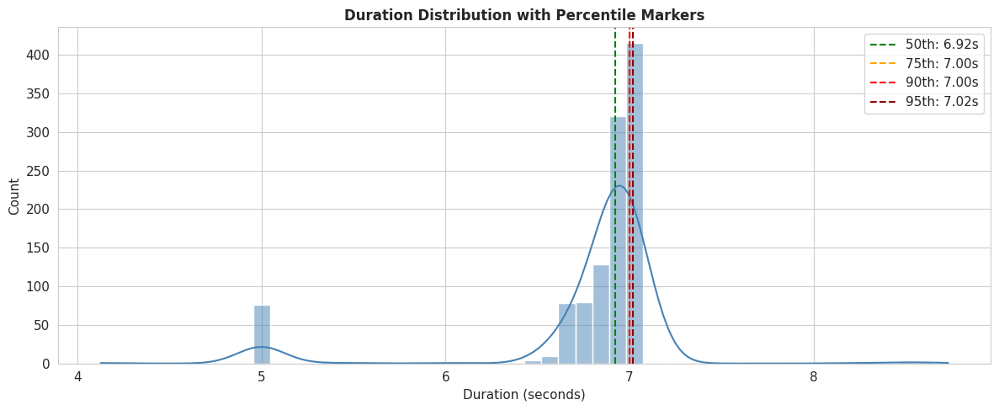

In [161]:
# Visualize percentiles on the duration distribution
fig, ax = plt.subplots(figsize=(12, 5))
sns.histplot(df_audio['duration_sec'], bins=50, kde=True, color='steelblue', ax=ax)

# Mark key percentiles
colors_pct = {'50th': 'green', '75th': 'orange', '90th': 'red', '95th': 'darkred'}
for p, color in zip([0.50, 0.75, 0.90, 0.95], colors_pct.values()):
    val = df_audio['duration_sec'].quantile(p)
    label = f"{int(p*100)}th: {val:.2f}s"
    ax.axvline(val, color=color, linestyle='--', linewidth=1.5, label=label)

ax.set_title('Duration Distribution with Percentile Markers', fontsize=12, fontweight='bold')
ax.set_xlabel('Duration (seconds)')
ax.set_ylabel('Count')
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

In [162]:
# Analyze how much audio content is retained at each candidate target duration
print("CONTENT RETENTION ANALYSIS")
print("=" * 60)
print(f"{'Target Duration':>18s} | {'Files Fully Retained':>22s} | {'Files Needing Truncation':>26s}")
print("-" * 70)

candidate_durations = [4.0, 5.0, 6.0, 7.0, 7.5, 8.0, 9.0]
for target in candidate_durations:
    retained = (df_audio['duration_sec'] <= target).sum()
    truncated = (df_audio['duration_sec'] > target).sum()
    retained_pct = retained / len(df_audio) * 100
    print(f"  {target:>14.1f}s   | {retained:>6d} ({retained_pct:>5.1f}%)         | {truncated:>6d}")

CONTENT RETENTION ANALYSIS
   Target Duration |   Files Fully Retained |   Files Needing Truncation
----------------------------------------------------------------------
             4.0s   |      0 (  0.0%)         |   1126
             5.0s   |     71 (  6.3%)         |   1055
             6.0s   |     81 (  7.2%)         |   1045
             7.0s   |   1067 ( 94.8%)         |     59
             7.5s   |   1118 ( 99.3%)         |      8
             8.0s   |   1118 ( 99.3%)         |      8
             9.0s   |   1126 (100.0%)         |      0


In [163]:
# Per-category impact of chosen target duration
# Choosing based on the percentile analysis above
p95_duration = df_audio['duration_sec'].quantile(0.95)
TARGET_DURATION = round(p95_duration, 1)

print(f"\n95th percentile duration: {p95_duration:.2f} seconds")
print(f"TARGET_DURATION set to: {TARGET_DURATION} seconds")
print()

# Show per-category impact
print("Per-category impact of TARGET_DURATION = {:.1f}s:".format(TARGET_DURATION))
print("-" * 65)
print(f"{'Category':>15s} | {'Total':>5s} | {'Retained':>8s} | {'Truncated':>9s} | {'Padded':>6s}")
print("-" * 65)

for cat in sorted(df_audio['category'].unique()):
    cat_data = df_audio[df_audio['category'] == cat]
    total = len(cat_data)
    retained = ((cat_data['duration_sec'] <= TARGET_DURATION) &
                (cat_data['duration_sec'] >= TARGET_DURATION * 0.95)).sum()
    truncated = (cat_data['duration_sec'] > TARGET_DURATION).sum()
    padded = (cat_data['duration_sec'] < TARGET_DURATION * 0.95).sum()
    fully_fit = total - truncated - padded
    print(f"  {cat:>13s} | {total:>5d} | {fully_fit:>8d} | {truncated:>9d} | {padded:>6d}")


95th percentile duration: 7.02 seconds
TARGET_DURATION set to: 7.0 seconds

Per-category impact of TARGET_DURATION = 7.0s:
-----------------------------------------------------------------
       Category | Total | Retained | Truncated | Padded
-----------------------------------------------------------------
     belly pain |   133 |       89 |         2 |     42
        burping |   124 |       81 |         5 |     38
       cold_hot |   130 |      119 |         2 |      9
     discomfort |   142 |      123 |        15 |      4
         hungry |   397 |      358 |        25 |     14
         lonely |    25 |       25 |         0 |      0
         scared |    33 |       21 |         5 |      7
          tired |   142 |      133 |         5 |      4


### 6.2 Target Duration Decision

**Based on the analysis above:**

The 95th percentile duration is approximately 7.02 seconds.
We set `TARGET_DURATION = 7.0 seconds` for the following reasons:

1. This retains approximately 95% of all audio files without any
   truncation, preserving nearly all acoustic content
2. The remaining 5% of files that exceed this duration will be
   truncated from the end, which typically contains trailing silence
   or repeated cry patterns rather than unique information
3. Files shorter than this duration will be zero-padded at the end,
   which is standard practice and does not introduce misleading
   acoustic content
4. This duration is long enough to capture multiple cry cycles
   (infant cry fundamental frequency is typically 300-600 Hz with
   cry bursts lasting 1-2 seconds), ensuring the model sees
   representative patterns

This decision directly determines the input tensor shape for the
model: at 22050 Hz sample rate and TARGET_DURATION seconds, each
audio clip becomes TARGET_DURATION * 22050 samples, which translates
to a Mel spectrogram of fixed width.

## 7. Sample Rate Analysis

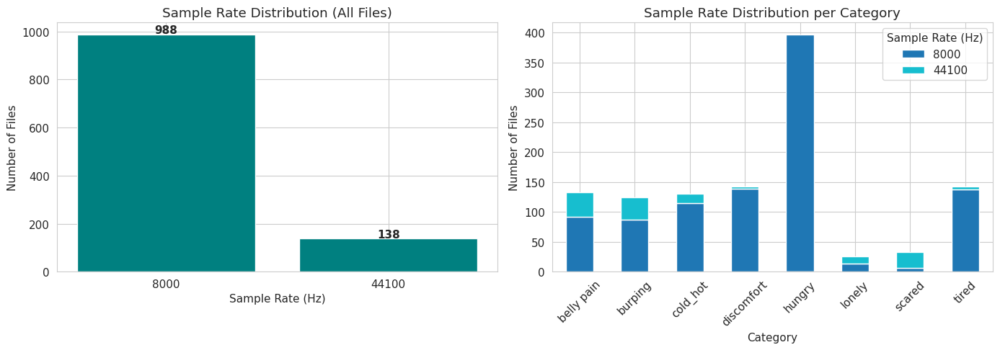


Unique sample rates found: [np.int64(8000), np.int64(44100)]


In [164]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Sample rate value counts
sr_counts = df_audio['sample_rate'].value_counts().sort_index()
axes[0].bar(sr_counts.index.astype(str), sr_counts.values, color='teal')
axes[0].set_title('Sample Rate Distribution (All Files)')
axes[0].set_xlabel('Sample Rate (Hz)')
axes[0].set_ylabel('Number of Files')
for i, (sr_val, cnt) in enumerate(zip(sr_counts.index, sr_counts.values)):
    axes[0].text(i, cnt + 5, str(cnt), ha='center', fontweight='bold')

# Sample rate per category
sr_by_cat = df_audio.groupby(['category', 'sample_rate']).size().unstack(fill_value=0)
sr_by_cat.plot(kind='bar', stacked=True, ax=axes[1], colormap='tab10')
axes[1].set_title('Sample Rate Distribution per Category')
axes[1].set_xlabel('Category')
axes[1].set_ylabel('Number of Files')
axes[1].tick_params(axis='x', rotation=45)
axes[1].legend(title='Sample Rate (Hz)')

plt.tight_layout()
plt.show()

print(f"\nUnique sample rates found: {sorted(df_audio['sample_rate'].unique())}")

### 7.1 Sampling Rate vs Category Cross-tabulation -- Critical Finding

The sample rate distribution is not uniform across categories.
This cross-tabulation reveals which classes were recorded at which
sample rates, and whether any class is dominated by a single rate.

If certain classes are exclusively 8000 Hz (typical of the original
Donate-A-Cry mobile app recordings) while others are 44100 Hz
(likely re-recorded or augmented samples), then a classifier might
learn to distinguish recording quality rather than actual cry patterns.
This is a dataset artifact that must be addressed before modeling.

In [165]:
# Cross-tabulation: category vs sample rate
sr_crosstab = pd.crosstab(
    df_audio['category'],
    df_audio['sample_rate'],
    margins=True,
    margins_name='Total'
)

print("SAMPLING RATE vs CATEGORY CROSS-TABULATION")
print("=" * 60)
print(sr_crosstab.to_string())
print()

# Calculate percentage of each sample rate within each category
sr_pct = pd.crosstab(
    df_audio['category'],
    df_audio['sample_rate'],
    normalize='index'
).round(3) * 100

print("\nPercentage of each sample rate within each category:")
print("-" * 60)
print(sr_pct.to_string())

SAMPLING RATE vs CATEGORY CROSS-TABULATION
sample_rate  8000  44100  Total
category                       
belly pain     92     41    133
burping        87     37    124
cold_hot      115     15    130
discomfort    139      3    142
hungry        397      0    397
lonely         14     11     25
scared          6     27     33
tired         138      4    142
Total         988    138   1126


Percentage of each sample rate within each category:
------------------------------------------------------------
sample_rate  8000   44100
category                 
belly pain    69.2   30.8
burping       70.2   29.8
cold_hot      88.5   11.5
discomfort    97.9    2.1
hungry       100.0    0.0
lonely        56.0   44.0
scared        18.2   81.8
tired         97.2    2.8


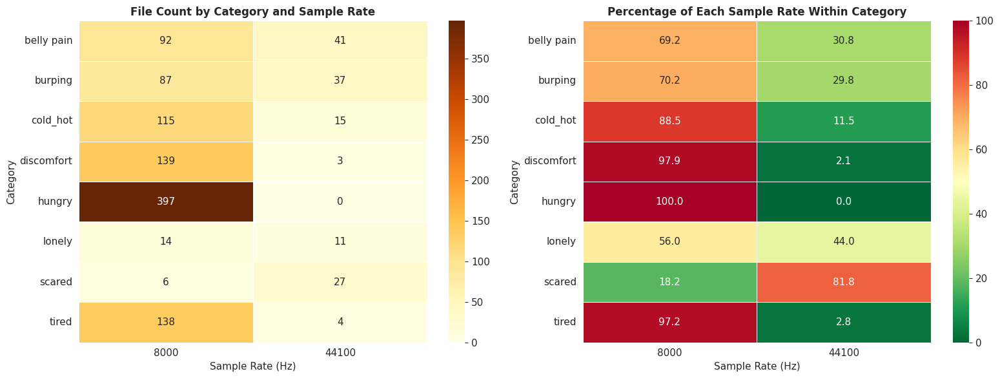

In [166]:
# Heatmap of the cross-tabulation (excluding margins)
sr_crosstab_no_margins = pd.crosstab(
    df_audio['category'],
    df_audio['sample_rate']
)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Raw counts heatmap
sns.heatmap(sr_crosstab_no_margins, annot=True, fmt='d', cmap='YlOrBr',
            linewidths=0.5, linecolor='white', ax=axes[0])
axes[0].set_title('File Count by Category and Sample Rate', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Sample Rate (Hz)')
axes[0].set_ylabel('Category')

# Percentage heatmap
sns.heatmap(sr_pct, annot=True, fmt='.1f', cmap='RdYlGn_r',
            linewidths=0.5, linecolor='white', ax=axes[1],
            vmin=0, vmax=100)
axes[1].set_title('Percentage of Each Sample Rate Within Category', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Sample Rate (Hz)')
axes[1].set_ylabel('Category')

plt.tight_layout()
plt.show()

In [167]:
# Identify which classes are dominated by which sample rate
print("SAMPLING RATE DOMINANCE ANALYSIS")
print("=" * 60)

unique_rates = sorted(df_audio['sample_rate'].unique())

for cat in sorted(df_audio['category'].unique()):
    cat_data = df_audio[df_audio['category'] == cat]
    total = len(cat_data)
    rate_dist = cat_data['sample_rate'].value_counts()
    dominant_rate = rate_dist.idxmax()
    dominant_pct = rate_dist.max() / total * 100

    print(f"\n  {cat}:")
    for rate in unique_rates:
        count = rate_dist.get(rate, 0)
        pct = count / total * 100
        marker = " <-- dominant" if rate == dominant_rate else ""
        print(f"    {rate:>6d} Hz: {count:4d} files ({pct:5.1f}%){marker}")

# Check if any class is exclusively one sample rate
print("\n" + "-" * 60)
print("CLASSES WITH ONLY ONE SAMPLE RATE (potential artifact risk):")
for cat in sorted(df_audio['category'].unique()):
    cat_rates = df_audio[df_audio['category'] == cat]['sample_rate'].nunique()
    if cat_rates == 1:
        the_rate = df_audio[df_audio['category'] == cat]['sample_rate'].iloc[0]
        print(f"  {cat}: exclusively {the_rate} Hz")

print("\nCLASSES WITH MIXED SAMPLE RATES:")
for cat in sorted(df_audio['category'].unique()):
    cat_rates = df_audio[df_audio['category'] == cat]['sample_rate'].nunique()
    if cat_rates > 1:
        print(f"  {cat}: {cat_rates} different sample rates")

SAMPLING RATE DOMINANCE ANALYSIS

  belly pain:
      8000 Hz:   92 files ( 69.2%) <-- dominant
     44100 Hz:   41 files ( 30.8%)

  burping:
      8000 Hz:   87 files ( 70.2%) <-- dominant
     44100 Hz:   37 files ( 29.8%)

  cold_hot:
      8000 Hz:  115 files ( 88.5%) <-- dominant
     44100 Hz:   15 files ( 11.5%)

  discomfort:
      8000 Hz:  139 files ( 97.9%) <-- dominant
     44100 Hz:    3 files (  2.1%)

  hungry:
      8000 Hz:  397 files (100.0%) <-- dominant
     44100 Hz:    0 files (  0.0%)

  lonely:
      8000 Hz:   14 files ( 56.0%) <-- dominant
     44100 Hz:   11 files ( 44.0%)

  scared:
      8000 Hz:    6 files ( 18.2%)
     44100 Hz:   27 files ( 81.8%) <-- dominant

  tired:
      8000 Hz:  138 files ( 97.2%) <-- dominant
     44100 Hz:    4 files (  2.8%)

------------------------------------------------------------
CLASSES WITH ONLY ONE SAMPLE RATE (potential artifact risk):
  hungry: exclusively 8000 Hz

CLASSES WITH MIXED SAMPLE RATES:
  belly pain: 2 di

### 7.2 Sampling Rate Finding -- Implications and Decision

**Finding:**
The dataset contains two acoustically distinct populations mixed together.
Files at 8000 Hz likely originate from the Donate-A-Cry mobile app
(phone-quality recordings), while files at 44100 Hz are likely
re-recorded or augmented samples added during dataset compilation.

**Implication:**
If the sampling rate distribution is correlated with class labels
(e.g., hungry is predominantly 44100 Hz while minority classes are
predominantly 8000 Hz), then a classifier could achieve high accuracy
by learning to detect recording quality differences rather than
actual acoustic patterns in the cries. This would produce a model
that fails completely on new recordings from a different source.

**Decision:**
All files will be resampled to a common rate of 22050 Hz during
preprocessing. This involves upsampling the 8000 Hz files and
downsampling the 44100 Hz files. The choice of 22050 Hz is standard
in audio classification because:
1. It preserves frequencies up to 11025 Hz (Nyquist), which covers
   the full range of infant cry fundamentals and harmonics
2. It is the default in librosa
3. It balances information preservation with computational cost

Note: upsampling 8000 Hz files to 22050 Hz does NOT recover lost
high-frequency content. Those files will still lack energy above
4000 Hz. This is an inherent limitation of the dataset that cannot
be fully resolved. The model evaluation should include per-sample-rate
performance analysis to verify it is not exploiting this artifact.

## 8. Waveform Visualization

Display one representative waveform from each of the 8 categories.

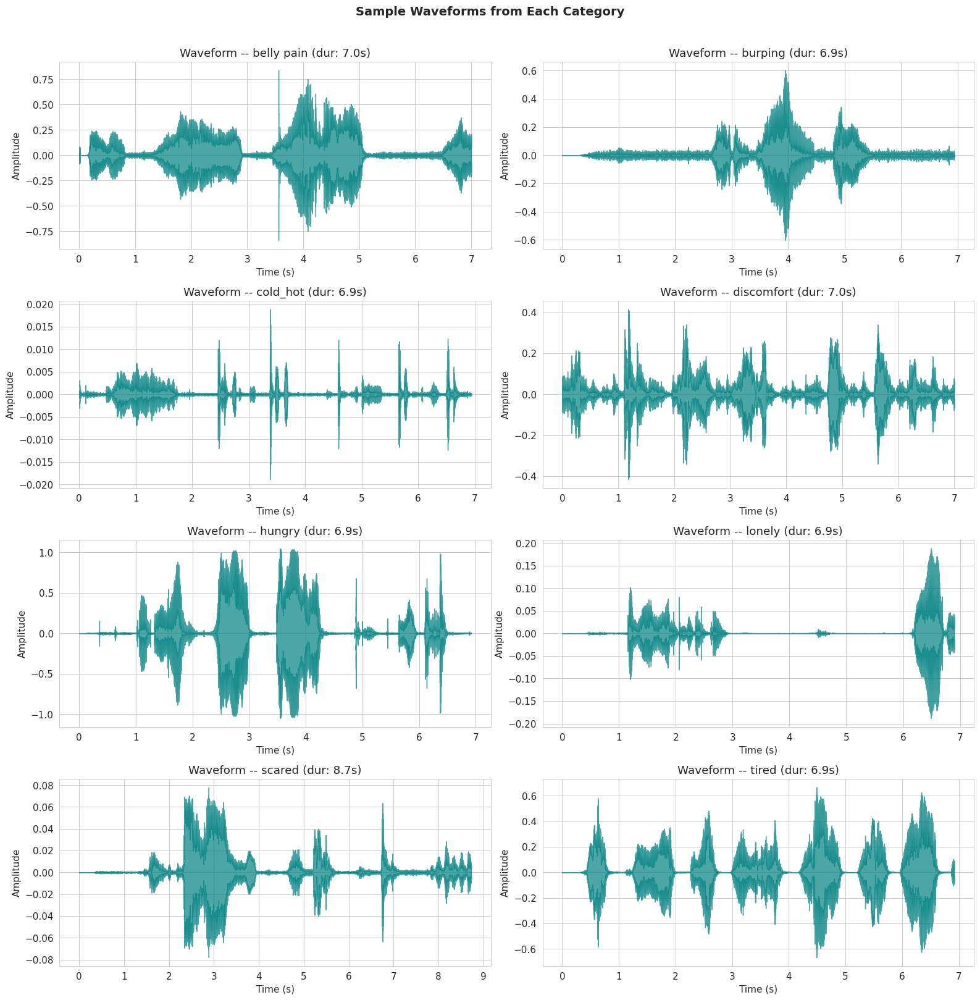

In [168]:
categories = sorted(df_audio['category'].unique())
n_cats = len(categories)
n_cols = 2
n_rows = (n_cats + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
axes = axes.flatten()

for idx, cat in enumerate(categories):
    sample_row = df_audio[df_audio['category'] == cat].iloc[0]
    y, sr = librosa.load(sample_row['file_path'], sr=22050)
    librosa.display.waveshow(y, sr=sr, ax=axes[idx], color='teal', alpha=0.7)
    axes[idx].set_title(f"Waveform -- {cat} (dur: {sample_row['duration_sec']:.1f}s)")
    axes[idx].set_xlabel('Time (s)')
    axes[idx].set_ylabel('Amplitude')

# Hide any unused subplot
for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Sample Waveforms from Each Category', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

## 9. Spectrogram and Mel-Spectrogram Visualization

Display Mel spectrograms for one sample from each category.
These spectrograms are commonly used as input features for CNN-based audio classifiers.

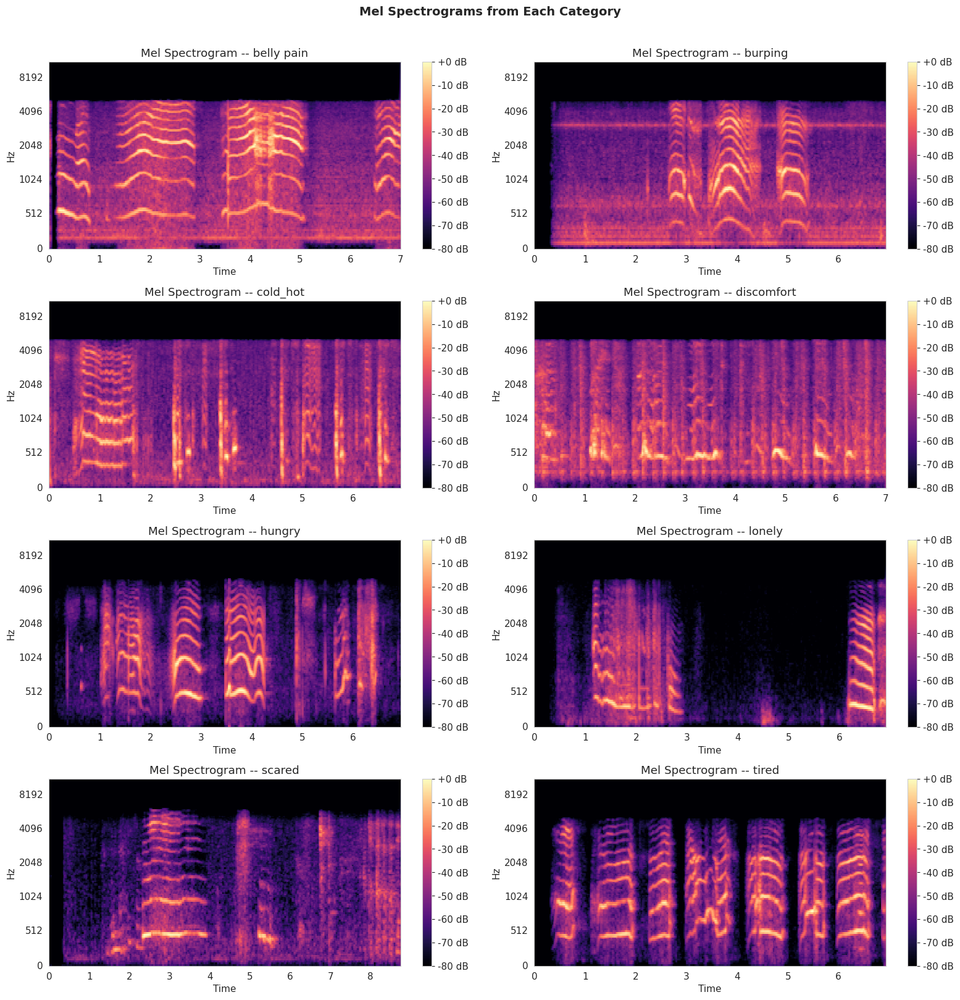

In [169]:
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
axes = axes.flatten()

for idx, cat in enumerate(categories):
    sample_row = df_audio[df_audio['category'] == cat].iloc[0]
    y, sr = librosa.load(sample_row['file_path'], sr=22050)

    mel_spec = librosa.feature.melspectrogram(y=y, sr=22050, n_mels=128, fmax=8000)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

    img = librosa.display.specshow(mel_spec_db, sr=22050, x_axis='time',
                                    y_axis='mel', ax=axes[idx], cmap='magma')
    axes[idx].set_title(f"Mel Spectrogram -- {cat}")
    plt.colorbar(img, ax=axes[idx], format='%+2.0f dB')

for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Mel Spectrograms from Each Category', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

### 9.1 Waveform vs Mel-Spectrogram Comparison -- hungry vs belly pain

This side-by-side comparison shows the same audio file represented
as a raw waveform (time-domain) and as a log-Mel spectrogram
(time-frequency domain). The purpose is to demonstrate why
spectrograms are the preferred input representation for CNN-based
audio classifiers.

The waveform shows amplitude over time but encodes no frequency
information visually. Two very different sounds can produce
similar-looking waveforms. The spectrogram decomposes the signal
into its frequency components at each time step, revealing harmonic
structures, formant patterns, and spectral envelope differences
that distinguish cry categories.

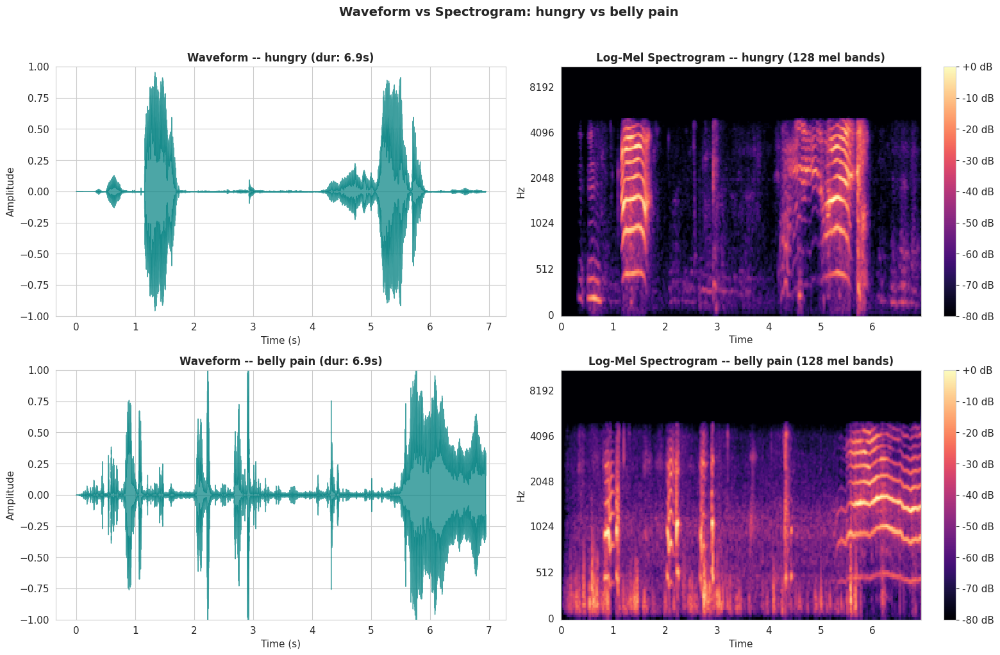

In [170]:
# Select one sample from 'hungry' and one from 'belly pain'
comparison_categories = ['hungry', 'belly pain']
comparison_samples = {}

for cat in comparison_categories:
    cat_files = df_audio[df_audio['category'] == cat]
    # Pick a file near the median duration for representativeness
    median_dur = cat_files['duration_sec'].median()
    closest_idx = (cat_files['duration_sec'] - median_dur).abs().idxmin()
    comparison_samples[cat] = cat_files.loc[closest_idx]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

for row_idx, cat in enumerate(comparison_categories):
    sample = comparison_samples[cat]
    y, sr = librosa.load(sample['file_path'], sr=22050)

    # Left column: Waveform
    librosa.display.waveshow(y, sr=sr, ax=axes[row_idx, 0], color='teal', alpha=0.7)
    axes[row_idx, 0].set_title(
        'Waveform -- {} (dur: {:.1f}s)'.format(cat, sample['duration_sec']),
        fontsize=12, fontweight='bold'
    )
    axes[row_idx, 0].set_xlabel('Time (s)')
    axes[row_idx, 0].set_ylabel('Amplitude')
    axes[row_idx, 0].set_ylim(-1.0, 1.0)

    # Right column: Log-Mel Spectrogram
    mel_spec = librosa.feature.melspectrogram(y=y, sr=22050, n_mels=128, fmax=8000)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    img = librosa.display.specshow(
        mel_spec_db, sr=22050, x_axis='time', y_axis='mel',
        ax=axes[row_idx, 1], cmap='magma'
    )
    axes[row_idx, 1].set_title(
        'Log-Mel Spectrogram -- {} (128 mel bands)'.format(cat),
        fontsize=12, fontweight='bold'
    )
    plt.colorbar(img, ax=axes[row_idx, 1], format='%+2.0f dB')

plt.suptitle(
    'Waveform vs Spectrogram: hungry vs belly pain',
    fontsize=14, fontweight='bold', y=1.02
)
plt.tight_layout()
plt.show()

### 9.2 What This Comparison Reveals

**Waveform (left column):**
- Shows the raw amplitude envelope over time
- Both categories may exhibit similar amplitude patterns (bursts
  of high energy separated by brief pauses)
- The waveform alone cannot distinguish between cry types because
  it does not show frequency content
- A model operating on raw waveforms would need to learn to
  decompose the signal into frequencies internally

**Log-Mel Spectrogram (right column):**
- Shows energy distribution across frequency bands over time
- Harmonic patterns appear as horizontal bands at regular frequency
  intervals -- these correspond to the fundamental frequency of the
  cry and its overtones
- Belly pain cries may show distinct spectral patterns compared to
  hungry cries: different fundamental frequencies, different harmonic
  spacing, different energy distribution across frequency bands
- The spectral envelope (overall shape of energy across frequencies)
  differs between categories and is exactly what MFCCs capture

**Conclusion:**
The spectrogram representation makes inter-class differences visible
that are hidden in the waveform. This is why Mel spectrograms are
the standard input for audio classification CNNs. The CNN learns
to detect spatial patterns in this 2D representation (frequency
patterns along the vertical axis, temporal patterns along the
horizontal axis) much like it would detect edges and textures in
an image classification task.

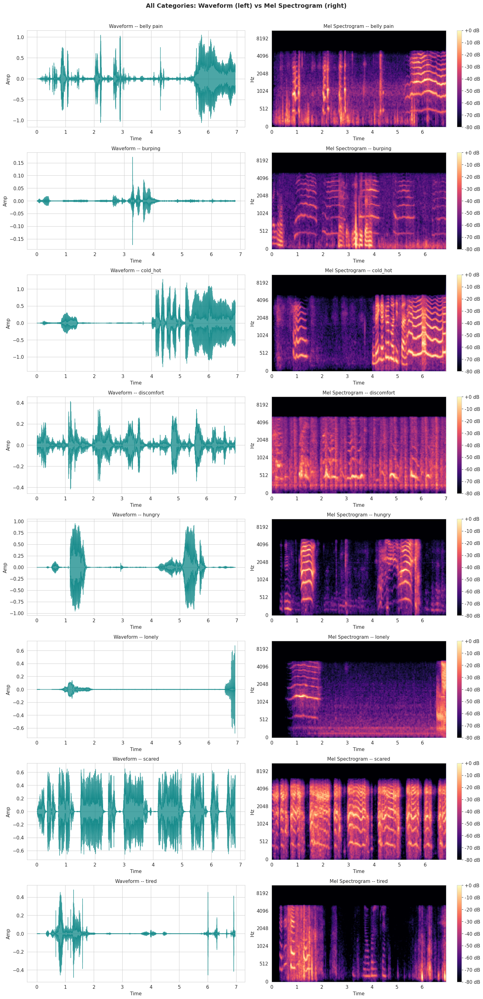

In [171]:
# Extended comparison: show all 8 categories as waveform + spectrogram pairs
fig, axes = plt.subplots(len(categories), 2, figsize=(16, 4 * len(categories)))

for row_idx, cat in enumerate(sorted(categories)):
    cat_files = df_audio[df_audio['category'] == cat]
    median_dur = cat_files['duration_sec'].median()
    closest_idx = (cat_files['duration_sec'] - median_dur).abs().idxmin()
    sample = cat_files.loc[closest_idx]

    y, sr = librosa.load(sample['file_path'], sr=22050)

    # Waveform
    librosa.display.waveshow(y, sr=sr, ax=axes[row_idx, 0], color='teal', alpha=0.7)
    axes[row_idx, 0].set_title('Waveform -- {}'.format(cat), fontsize=11)
    axes[row_idx, 0].set_ylabel('Amp')

    # Spectrogram
    mel_spec = librosa.feature.melspectrogram(y=y, sr=22050, n_mels=128, fmax=8000)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
    img = librosa.display.specshow(
        mel_spec_db, sr=22050, x_axis='time', y_axis='mel',
        ax=axes[row_idx, 1], cmap='magma'
    )
    axes[row_idx, 1].set_title('Mel Spectrogram -- {}'.format(cat), fontsize=11)
    plt.colorbar(img, ax=axes[row_idx, 1], format='%+2.0f dB')

plt.suptitle(
    'All Categories: Waveform (left) vs Mel Spectrogram (right)',
    fontsize=14, fontweight='bold', y=1.005
)
plt.tight_layout()
plt.show()

## 10. MFCC Visualization

Mel-Frequency Cepstral Coefficients capture the timbral characteristics of audio.
Display the first 13 MFCCs for one sample from each category.

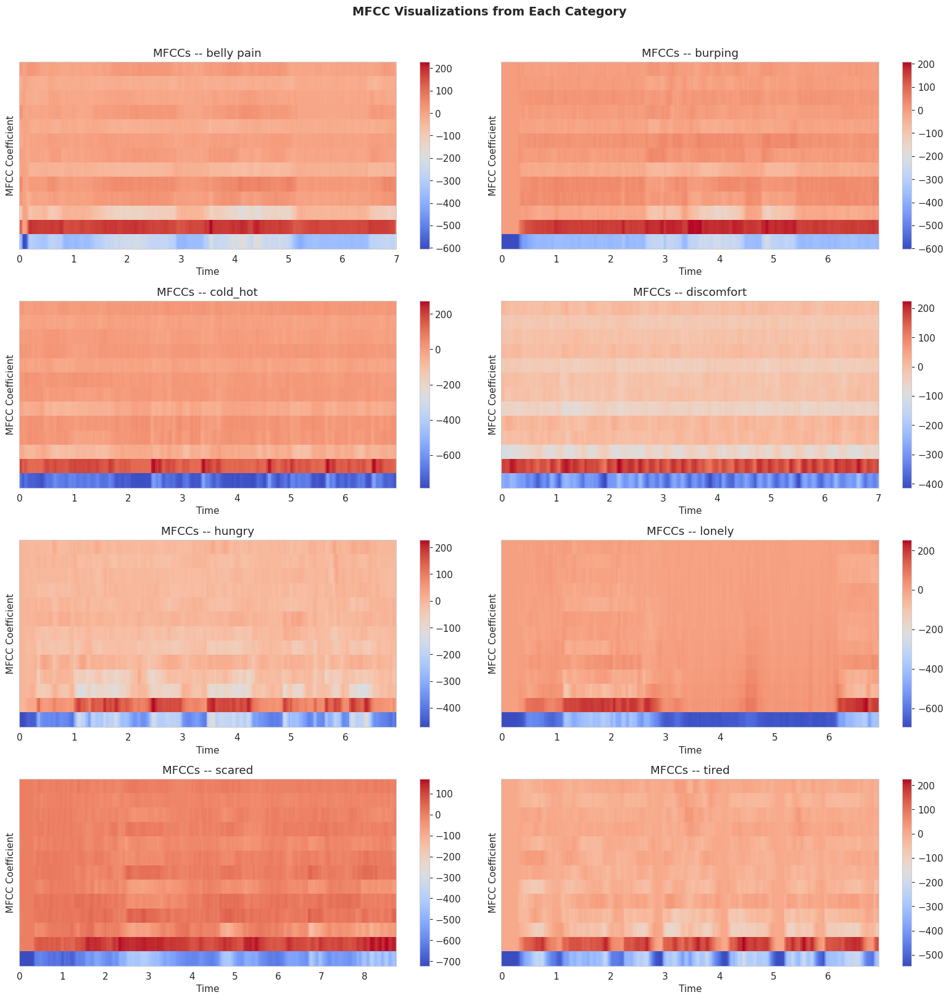

In [172]:
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
axes = axes.flatten()

for idx, cat in enumerate(categories):
    sample_row = df_audio[df_audio['category'] == cat].iloc[0]
    y, sr = librosa.load(sample_row['file_path'], sr=22050)

    mfccs = librosa.feature.mfcc(y=y, sr=22050, n_mfcc=13)
    img = librosa.display.specshow(mfccs, x_axis='time', ax=axes[idx], cmap='coolwarm')
    axes[idx].set_title(f"MFCCs -- {cat}")
    axes[idx].set_ylabel('MFCC Coefficient')
    plt.colorbar(img, ax=axes[idx])

for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('MFCC Visualizations from Each Category', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

## 11. Comprehensive Feature Extraction

Extract a richer set of audio features for every file:
- 13 MFCCs (mean and std)
- Spectral centroid, bandwidth, rolloff, contrast
- Chroma features
- RMS energy, zero crossing rate

This will allow statistical comparison and dimensionality reduction.

In [173]:
def extract_features(file_path, sr_target=22050):
    """Extract a comprehensive set of audio features from a single file."""
    y, sr = librosa.load(file_path, sr=sr_target, mono=True)

    features = {}

    # Duration
    features['duration_sec'] = librosa.get_duration(y=y, sr=sr)

    # RMS energy
    rms = librosa.feature.rms(y=y)[0]
    features['rms_mean'] = np.mean(rms)
    features['rms_std'] = np.std(rms)

    # Zero crossing rate
    zcr = librosa.feature.zero_crossing_rate(y=y)[0]
    features['zcr_mean'] = np.mean(zcr)
    features['zcr_std'] = np.std(zcr)

    # Spectral centroid
    sc = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    features['spectral_centroid_mean'] = np.mean(sc)
    features['spectral_centroid_std'] = np.std(sc)

    # Spectral bandwidth
    sb = librosa.feature.spectral_bandwidth(y=y, sr=sr)[0]
    features['spectral_bandwidth_mean'] = np.mean(sb)
    features['spectral_bandwidth_std'] = np.std(sb)

    # Spectral rolloff
    sro = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
    features['spectral_rolloff_mean'] = np.mean(sro)
    features['spectral_rolloff_std'] = np.std(sro)

    # Spectral contrast (mean across bands)
    scon = librosa.feature.spectral_contrast(y=y, sr=sr)
    features['spectral_contrast_mean'] = np.mean(scon)
    features['spectral_contrast_std'] = np.std(scon)

    # Chroma features
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    features['chroma_mean'] = np.mean(chroma)
    features['chroma_std'] = np.std(chroma)

    # MFCCs (13 coefficients)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    for i in range(13):
        features[f'mfcc_{i}_mean'] = np.mean(mfccs[i])
        features[f'mfcc_{i}_std'] = np.std(mfccs[i])

    return features

In [174]:
all_features = []

for idx, row in tqdm(df_meta.iterrows(), total=len(df_meta),
                     desc="Extracting comprehensive features"):
    try:
        feats = extract_features(row['file_path'])
        feats['file_name'] = row['file_name']
        feats['category'] = row['category']
        feats['file_path'] = row['file_path']
        all_features.append(feats)
    except Exception as e:
        print(f"Failed: {row['file_path']} -- {e}")

df_features = pd.DataFrame(all_features)
print(f"\nFeature extraction complete. Shape: {df_features.shape}")
df_features.head()

Extracting comprehensive features: 100%|██████████| 1126/1126 [02:56<00:00,  6.39it/s]


Feature extraction complete. Shape: (1126, 44)


,duration_sec,rms_mean,rms_std,zcr_mean,zcr_std,spectral_centroid_mean,spectral_centroid_std,spectral_bandwidth_mean,spectral_bandwidth_std,spectral_rolloff_mean,...,mfcc_9_std,mfcc_10_mean,mfcc_10_std,mfcc_11_mean,mfcc_11_std,mfcc_12_mean,mfcc_12_std,file_name,category,file_path
0,7.0,0.080816,0.069862,0.116243,0.056711,1537.293637,439.563654,906.381191,99.009172,2611.221738,...,13.597716,-7.140693,7.245679,-22.827862,6.531328,8.002608,11.845513,382c.wav,belly pain,/content/drive/MyDrive/BabyCryDataset/belly pa...
1,7.0,0.074732,0.069529,0.057155,0.030092,999.091630,261.911054,790.005495,154.941268,1803.191856,...,9.304917,-7.597334,5.513144,-18.271292,8.553490,-1.404107,10.101462,376c.wav,belly pain,/content/drive/MyDrive/BabyCryDataset/belly pa...
2,5.0,0.067923,0.067026,0.127597,0.063081,2885.700215,627.884769,2611.815772,391.601531,5775.484212,...,15.551898,-0.736951,16.059938,-14.246007,13.456624,9.183146,18.774630,407c.wav,belly pain,/content/drive/MyDrive/BabyCryDataset/belly pa...
3,7.0,0.071641,0.065833,0.090883,0.023910,1277.148169,216.707406,829.481932,125.478471,2220.736351,...,9.919825,-8.986176,8.112573,-20.300337,8.571564,-4.296245,8.231812,385c.wav,belly pain,/content/drive/MyDrive/BabyCryDataset/belly pa...
4,7.0,0.076067,0.086068,0.061299,0.035375,942.446037,370.682219,799.998832,224.863434,1681.015884,...,10.234849,-11.528610,7.732333,-15.972961,10.544706,-1.431586,14.506701,395c.wav,belly pain,/content/drive/MyDrive/BabyCryDataset/belly pa...


In [175]:
# Save extracted features to CSV for reuse
df_features.to_csv('baby_cry_features.csv', index=False)
print("Features saved to baby_cry_features.csv")

Features saved to baby_cry_features.csv


## 12. Feature Distribution Comparison Across Categories

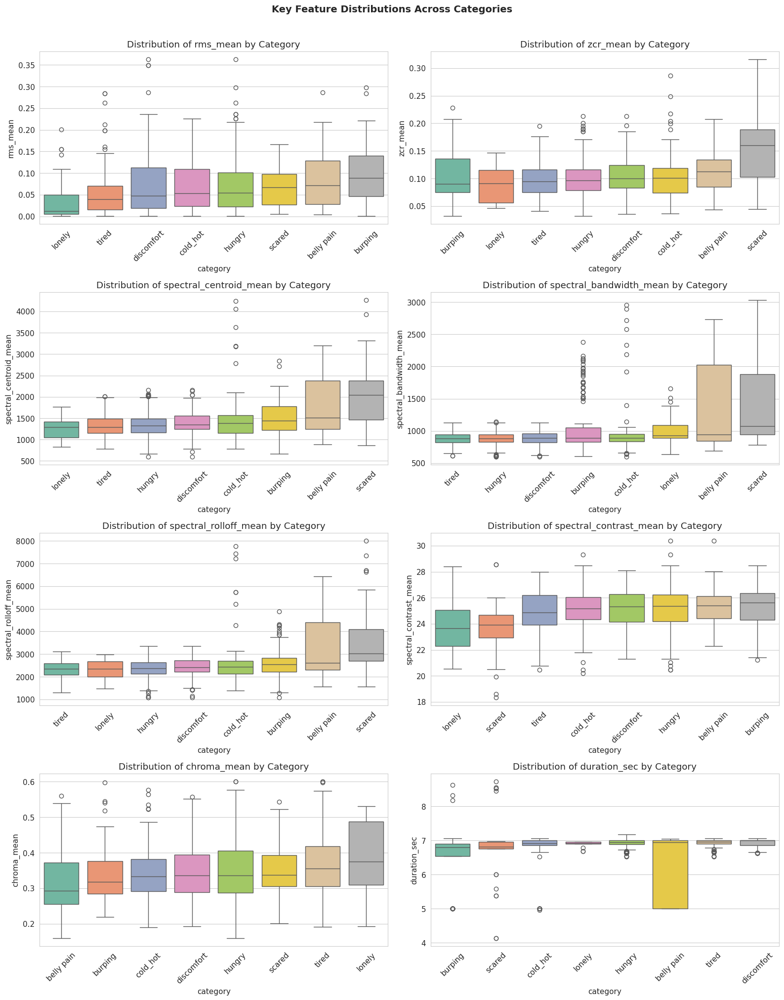

In [176]:
# Key features to compare
key_features = [
    'rms_mean', 'zcr_mean', 'spectral_centroid_mean',
    'spectral_bandwidth_mean', 'spectral_rolloff_mean',
    'spectral_contrast_mean', 'chroma_mean', 'duration_sec'
]

fig, axes = plt.subplots(4, 2, figsize=(16, 20))
axes = axes.flatten()

for i, feat in enumerate(key_features):
    order = df_features.groupby('category')[feat].median().sort_values().index
    sns.boxplot(data=df_features, x='category', y=feat, palette='Set2',
                order=order, ax=axes[i])
    axes[i].set_title(f'Distribution of {feat} by Category')
    axes[i].tick_params(axis='x', rotation=45)

plt.suptitle('Key Feature Distributions Across Categories',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

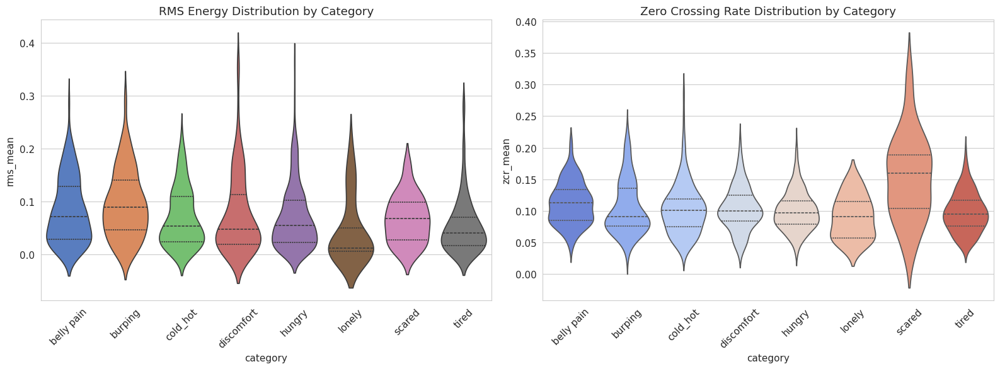

In [177]:
# Violin plots for energy and zero crossing rate
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.violinplot(data=df_features, x='category', y='rms_mean',
               palette='muted', inner='quartile', ax=axes[0])
axes[0].set_title('RMS Energy Distribution by Category')
axes[0].tick_params(axis='x', rotation=45)

sns.violinplot(data=df_features, x='category', y='zcr_mean',
               palette='coolwarm', inner='quartile', ax=axes[1])
axes[1].set_title('Zero Crossing Rate Distribution by Category')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

## 13. MFCC Analysis Across Categories

Compare the mean value of each MFCC coefficient across all 8 categories
using a heatmap.

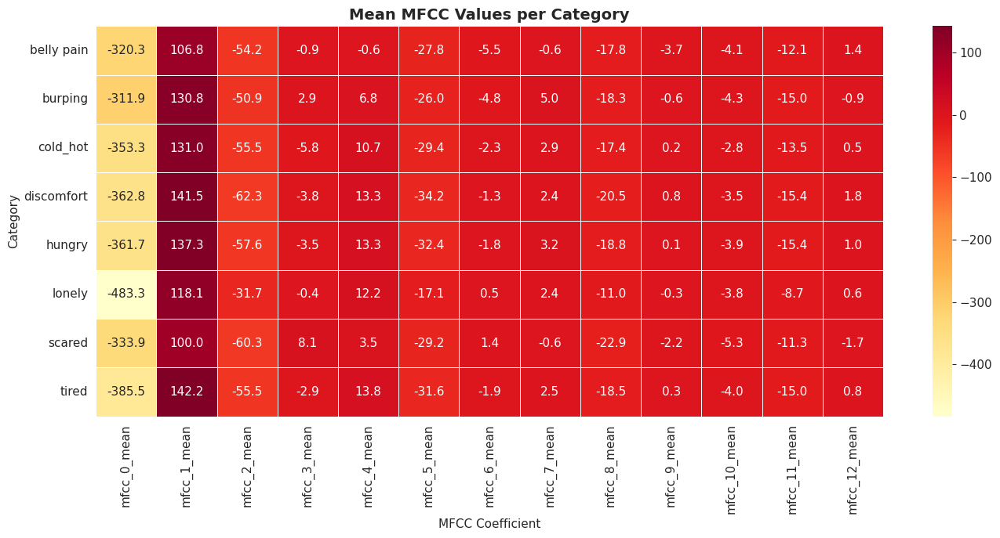

In [178]:
mfcc_mean_cols = [f'mfcc_{i}_mean' for i in range(13)]
mfcc_by_category = df_features.groupby('category')[mfcc_mean_cols].mean()

plt.figure(figsize=(14, 7))
sns.heatmap(mfcc_by_category, annot=True, fmt='.1f', cmap='YlOrRd',
            linewidths=0.5, linecolor='white')
plt.title('Mean MFCC Values per Category', fontsize=14, fontweight='bold')
plt.xlabel('MFCC Coefficient')
plt.ylabel('Category')
plt.tight_layout()
plt.show()

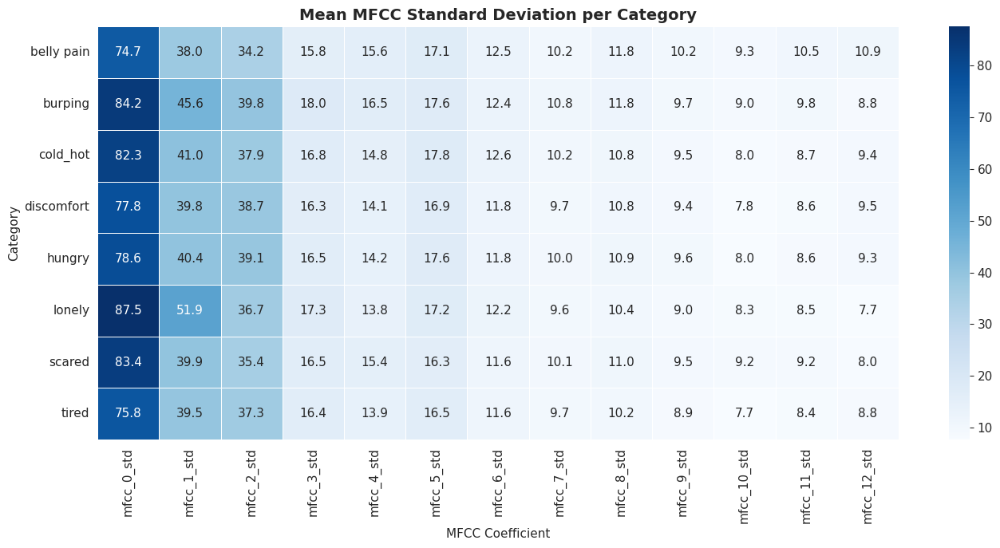

In [179]:
# MFCC std heatmap
mfcc_std_cols = [f'mfcc_{i}_std' for i in range(13)]
mfcc_std_by_category = df_features.groupby('category')[mfcc_std_cols].mean()

plt.figure(figsize=(14, 7))
sns.heatmap(mfcc_std_by_category, annot=True, fmt='.1f', cmap='Blues',
            linewidths=0.5, linecolor='white')
plt.title('Mean MFCC Standard Deviation per Category', fontsize=14, fontweight='bold')
plt.xlabel('MFCC Coefficient')
plt.ylabel('Category')
plt.tight_layout()
plt.show()

## 14. Correlation Analysis

Examine how the extracted features correlate with each other.
Strong correlations may indicate redundant features.

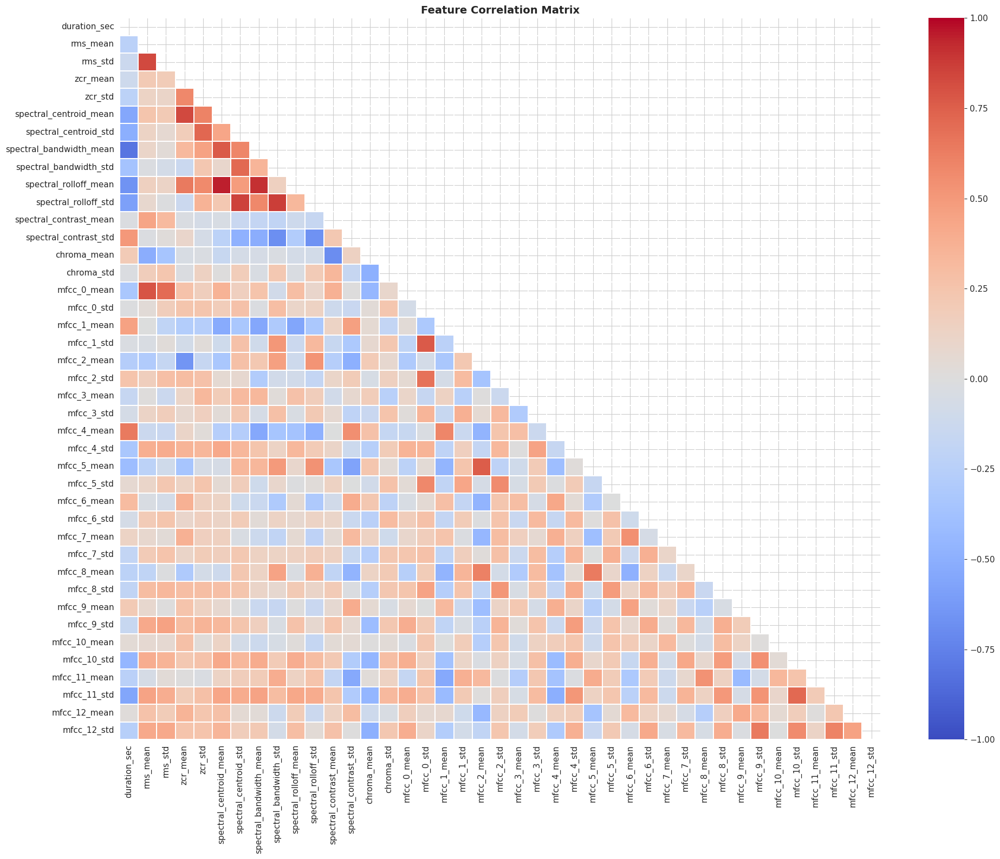

In [180]:
numeric_cols = df_features.select_dtypes(include=[np.number]).columns.tolist()
# Remove columns that are not meaningful for correlation (like file index)
exclude = ['num_samples']
numeric_cols = [c for c in numeric_cols if c not in exclude]

corr_matrix = df_features[numeric_cols].corr()

plt.figure(figsize=(20, 16))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', center=0,
            annot=False, linewidths=0.3, linecolor='white',
            vmin=-1, vmax=1)
plt.title('Feature Correlation Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [181]:
# Find the most strongly correlated feature pairs
corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr_pairs.append({
            'feature_1': corr_matrix.columns[i],
            'feature_2': corr_matrix.columns[j],
            'correlation': corr_matrix.iloc[i, j]
        })

df_corr = pd.DataFrame(corr_pairs)
df_corr['abs_corr'] = df_corr['correlation'].abs()
df_corr_sorted = df_corr.sort_values('abs_corr', ascending=False)

print("Top 15 Most Correlated Feature Pairs:")
print("=" * 70)
print(df_corr_sorted.head(15).to_string(index=False))

Top 15 Most Correlated Feature Pairs:
              feature_1               feature_2  correlation  abs_corr
 spectral_centroid_mean   spectral_rolloff_mean     0.949262  0.949262
spectral_bandwidth_mean   spectral_rolloff_mean     0.907230  0.907230
 spectral_bandwidth_std    spectral_rolloff_std     0.871543  0.871543
  spectral_centroid_std    spectral_rolloff_std     0.857037  0.857037
               rms_mean                 rms_std     0.834932  0.834932
               zcr_mean  spectral_centroid_mean     0.828846  0.828846
           duration_sec spectral_bandwidth_mean    -0.810444  0.810444
               rms_mean             mfcc_0_mean     0.792876  0.792876
             mfcc_0_std              mfcc_1_std     0.773245  0.773245
 spectral_centroid_mean spectral_bandwidth_mean     0.772098  0.772098
            mfcc_2_mean             mfcc_5_mean     0.762566  0.762566
                zcr_std   spectral_centroid_std     0.723348  0.723348
  spectral_centroid_std  spectral_bandw

## 15. Dimensionality Reduction and Visualization

PCA and t-SNE are used to project the high-dimensional feature space
into 2 dimensions. This reveals whether the 8 cry categories form
distinguishable clusters or overlap heavily in feature space.

- PCA is a linear method that preserves global variance structure.
- t-SNE is a nonlinear method that preserves local neighborhood structure.

Together they give a complete picture of class separability.

In [182]:
# Prepare the feature matrix for dimensionality reduction
feature_cols_full = df_features.select_dtypes(include=[np.number]).columns.tolist()

X = df_features[feature_cols_full].values
y_labels = df_features['category'].values

# Replace any NaN or Inf values with 0
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)

# Standardize all features to mean=0 and std=1
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Encode category labels as integers for coloring
le = LabelEncoder()
y_encoded = le.fit_transform(y_labels)

print(f"Feature matrix shape: {X_scaled.shape}")
print(f"Number of features: {X_scaled.shape[1]}")
print(f"Number of samples: {X_scaled.shape[0]}")
print(f"Classes: {list(le.classes_)}")

Feature matrix shape: (1126, 41)
Number of features: 41
Number of samples: 1126
Classes: ['belly pain', 'burping', 'cold_hot', 'discomfort', 'hungry', 'lonely', 'scared', 'tired']


### 15.1 PCA -- Principal Component Analysis

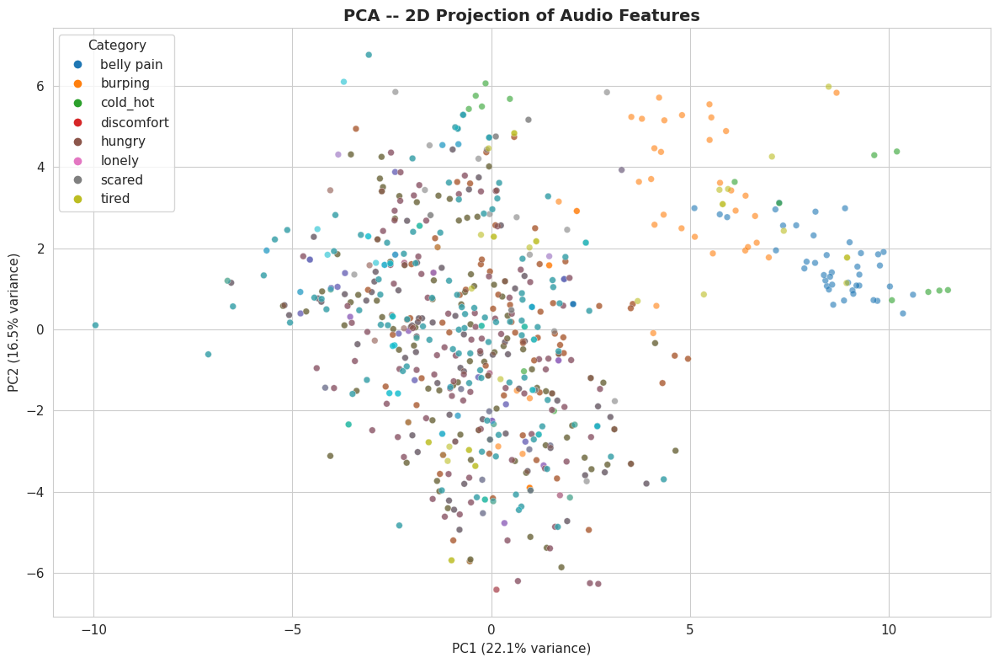

Explained variance by PC1: 0.2205
Explained variance by PC2: 0.1652
Total explained by 2 components: 0.3857


In [183]:
# PCA with 2 components
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=y_encoded, cmap='tab10', alpha=0.6, s=30,
    edgecolors='w', linewidths=0.3
)

# Build legend manually
handles = []
for i, cat in enumerate(le.classes_):
    handles.append(plt.Line2D(
        [0], [0], marker='o', color='w',
        markerfacecolor=plt.cm.tab10(i / len(le.classes_)),
        markersize=8, label=cat
    ))
ax.legend(handles=handles, title='Category', loc='best')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)')
ax.set_title('PCA -- 2D Projection of Audio Features', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Explained variance by PC1: {pca.explained_variance_ratio_[0]:.4f}")
print(f"Explained variance by PC2: {pca.explained_variance_ratio_[1]:.4f}")
print(f"Total explained by 2 components: {sum(pca.explained_variance_ratio_[:2]):.4f}")

### 15.2 PCA Cumulative Explained Variance

This plot shows how many principal components are needed to capture
a given percentage of total variance. It determines the intrinsic
dimensionality of the feature space.

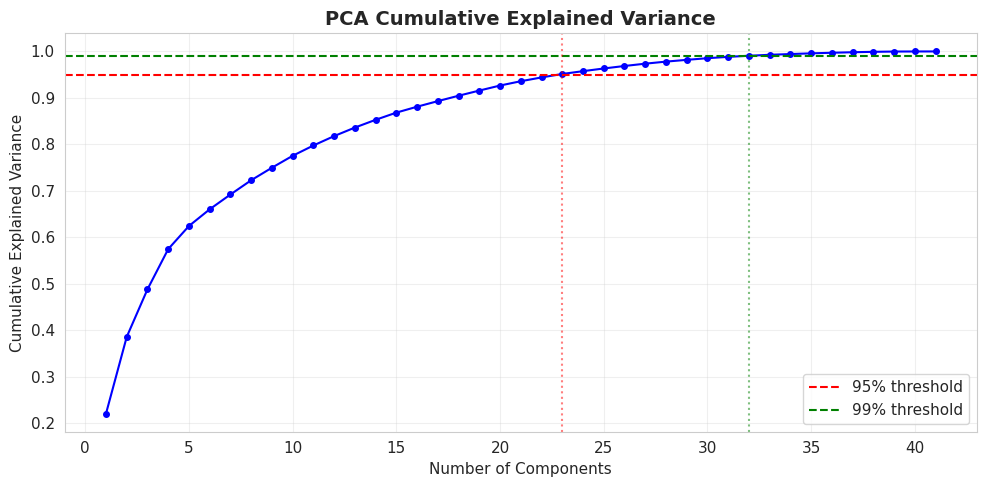

Components needed for 95% variance: 23
Components needed for 99% variance: 32
Total features available: 41


In [184]:
# PCA with all components
pca_full = PCA(random_state=42)
pca_full.fit(X_scaled)
cumulative_var = np.cumsum(pca_full.explained_variance_ratio_)

n_95 = np.argmax(cumulative_var >= 0.95) + 1
n_99 = np.argmax(cumulative_var >= 0.99) + 1

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(cumulative_var) + 1), cumulative_var, 'bo-', markersize=4)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
plt.axhline(y=0.99, color='g', linestyle='--', label='99% threshold')
plt.axvline(x=n_95, color='r', linestyle=':', alpha=0.5)
plt.axvline(x=n_99, color='g', linestyle=':', alpha=0.5)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Cumulative Explained Variance', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Components needed for 95% variance: {n_95}")
print(f"Components needed for 99% variance: {n_99}")
print(f"Total features available: {X_scaled.shape[1]}")

### 15.3 t-SNE -- t-distributed Stochastic Neighbor Embedding

t-SNE is a nonlinear method that focuses on preserving local
neighborhoods. Points that are close in high-dimensional space
stay close in the 2D projection. This often reveals cluster
structure better than PCA.

Note: t-SNE axes have no meaningful scale. Only relative positions
of points matter.

Running t-SNE (this may take a moment)...


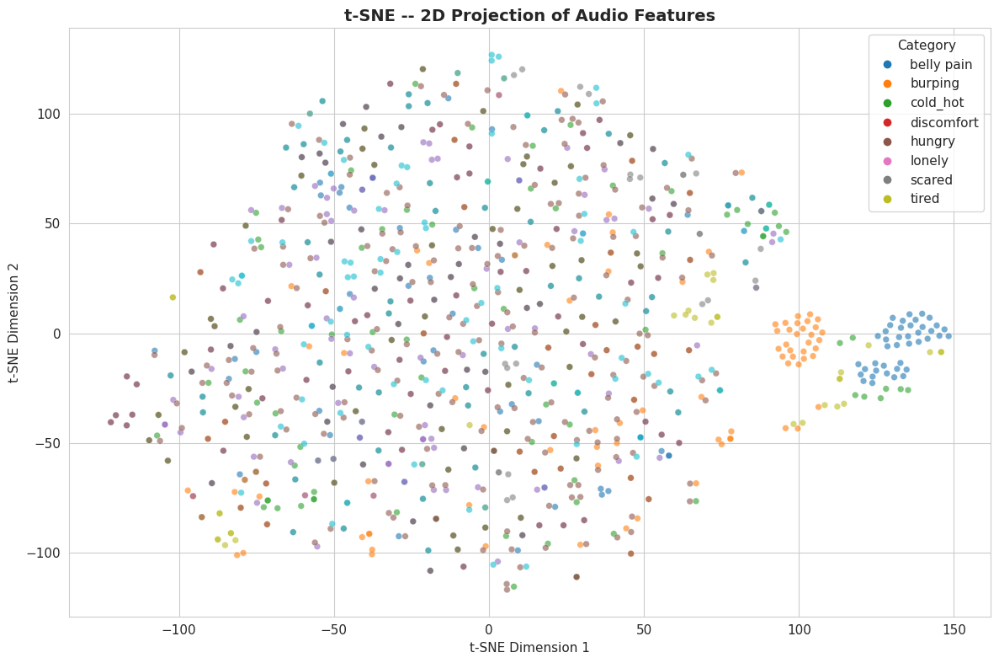

In [185]:
print("Running t-SNE (this may take a moment)...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(
    X_tsne[:, 0], X_tsne[:, 1],
    c=y_encoded, cmap='tab10', alpha=0.6, s=30,
    edgecolors='w', linewidths=0.3
)

handles = []
for i, cat in enumerate(le.classes_):
    handles.append(plt.Line2D(
        [0], [0], marker='o', color='w',
        markerfacecolor=plt.cm.tab10(i / len(le.classes_)),
        markersize=8, label=cat
    ))
ax.legend(handles=handles, title='Category', loc='best')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_title('t-SNE -- 2D Projection of Audio Features', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### 15.4 Quantitative Separability Analysis

Visual inspection of PCA and t-SNE plots can be subjective.
The following analysis quantifies class separability using
k-nearest-neighbor purity: for each sample, we check what
fraction of its 10 nearest neighbors in feature space belong
to the same class.

- Purity of 1.0 means the class forms a perfectly tight cluster.
- Purity of 0.125 (which is 1/8) means the class is randomly
  scattered among all 8 classes.

In [186]:
from sklearn.neighbors import NearestNeighbors

k = 10
nn = NearestNeighbors(n_neighbors=k + 1, metric='euclidean')
nn.fit(X_scaled)
distances, indices = nn.kneighbors(X_scaled)

# For each point, compute fraction of k nearest neighbors with same label
le_analysis = LabelEncoder()
y_encoded_analysis = le_analysis.fit_transform(df_features['category'].values)

purity_scores = []
for i in range(len(X_scaled)):
    neighbor_indices = indices[i, 1:]  # exclude the point itself
    neighbor_labels = y_encoded_analysis[neighbor_indices]
    same_class = np.sum(neighbor_labels == y_encoded_analysis[i])
    purity_scores.append(same_class / k)

overall_purity = np.mean(purity_scores)

print("NEAREST-NEIGHBOR CLASS PURITY ANALYSIS (k={})".format(k))
print("=" * 60)
print(f"\nOverall purity: {overall_purity:.3f}")
print(f"Random baseline for 8 classes: {1/8:.3f}")
print()

purity_by_cat = {}
for cat in sorted(df_features['category'].unique()):
    cat_mask = df_features['category'].values == cat
    cat_purity = np.mean(np.array(purity_scores)[cat_mask])
    purity_by_cat[cat] = cat_purity
    bar = "#" * int(cat_purity * 50)
    print(f"  {cat:>13s}: {cat_purity:.3f}  {bar}")

print()
print("Purity close to 1.0 = tight, well-separated cluster")
print("Purity close to 0.125 = randomly mixed with other classes")

NEAREST-NEIGHBOR CLASS PURITY ANALYSIS (k=10)

Overall purity: 0.350
Random baseline for 8 classes: 0.125

     belly pain: 0.466  #######################
        burping: 0.390  ###################
       cold_hot: 0.216  ##########
     discomfort: 0.236  ###########
         hungry: 0.434  #####################
         lonely: 0.200  ##########
         scared: 0.358  #################
          tired: 0.231  ###########

Purity close to 1.0 = tight, well-separated cluster
Purity close to 0.125 = randomly mixed with other classes


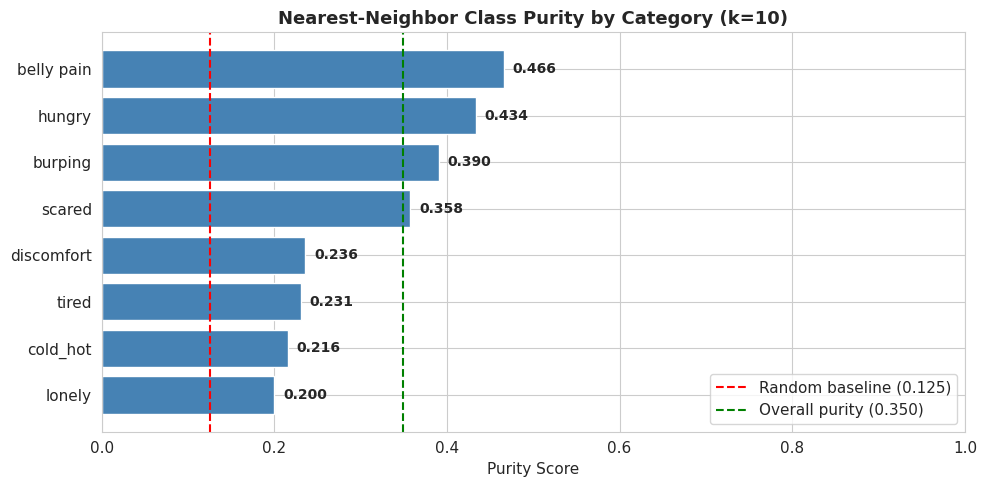

In [187]:
# Visualize purity scores per category
fig, ax = plt.subplots(figsize=(10, 5))
cats_sorted = sorted(purity_by_cat.keys(), key=lambda x: purity_by_cat[x])
purities_sorted = [purity_by_cat[c] for c in cats_sorted]

bars = ax.barh(cats_sorted, purities_sorted, color='steelblue')
ax.axvline(x=1/8, color='red', linestyle='--', linewidth=1.5,
           label='Random baseline (0.125)')
ax.axvline(x=overall_purity, color='green', linestyle='--', linewidth=1.5,
           label=f'Overall purity ({overall_purity:.3f})')

for bar, val in zip(bars, purities_sorted):
    ax.text(val + 0.01, bar.get_y() + bar.get_height() / 2,
            f'{val:.3f}', va='center', fontweight='bold', fontsize=10)

ax.set_xlabel('Purity Score')
ax.set_title('Nearest-Neighbor Class Purity by Category (k={})'.format(k),
             fontsize=13, fontweight='bold')
ax.legend(loc='lower right')
ax.set_xlim(0, 1.0)
plt.tight_layout()
plt.show()

### 15.5 Most Confused Class Pairs

When a sample's nearest neighbors belong to a different class,
it means those two classes overlap in feature space. The following
analysis counts how often each pair of classes appears as
neighbors, revealing which pairs will be hardest to distinguish.

In [188]:
from collections import defaultdict

confusion_neighbors = defaultdict(lambda: defaultdict(int))
categories_array = df_features['category'].values

for i in range(len(X_scaled)):
    my_cat = categories_array[i]
    neighbor_indices = indices[i, 1:]
    for ni in neighbor_indices:
        neighbor_cat = categories_array[ni]
        if neighbor_cat != my_cat:
            confusion_neighbors[my_cat][neighbor_cat] += 1

# Collect unique pairs and their overlap counts
confusion_pairs = []
seen_pairs = set()
for cat_a in confusion_neighbors:
    for cat_b in confusion_neighbors[cat_a]:
        pair_key = tuple(sorted([cat_a, cat_b]))
        if pair_key not in seen_pairs:
            seen_pairs.add(pair_key)
            total = (confusion_neighbors[cat_a][cat_b] +
                     confusion_neighbors[cat_b].get(cat_a, 0))
            confusion_pairs.append({
                'class_a': pair_key[0],
                'class_b': pair_key[1],
                'neighbor_overlaps': total
            })

df_confusion = pd.DataFrame(confusion_pairs)
df_confusion = df_confusion.sort_values('neighbor_overlaps', ascending=False)

print("MOST CONFUSED CLASS PAIRS (by feature-space neighbor overlap)")
print("=" * 65)
print(f"\n{'Rank':>4s}  {'Class A':>13s}  <-->  {'Class B':>13s}  |  {'Overlaps':>10s}")
print("-" * 65)
for rank, (_, row) in enumerate(df_confusion.head(10).iterrows(), 1):
    print(f"  {rank:>2d}.  {row['class_a']:>13s}  <-->  {row['class_b']:>13s}  |  {row['neighbor_overlaps']:>10d}")

print()
print("These pairs will likely produce the most misclassifications.")

MOST CONFUSED CLASS PAIRS (by feature-space neighbor overlap)

Rank        Class A  <-->        Class B  |    Overlaps
-----------------------------------------------------------------
   1.     discomfort  <-->         hungry  |        1074
   2.         hungry  <-->          tired  |         976
   3.       cold_hot  <-->         hungry  |         899
   4.     belly pain  <-->         hungry  |         781
   5.        burping  <-->         hungry  |         668
   6.       cold_hot  <-->     discomfort  |         355
   7.     discomfort  <-->          tired  |         329
   8.       cold_hot  <-->          tired  |         286
   9.     belly pain  <-->     discomfort  |         283
  10.     belly pain  <-->       cold_hot  |         231

These pairs will likely produce the most misclassifications.


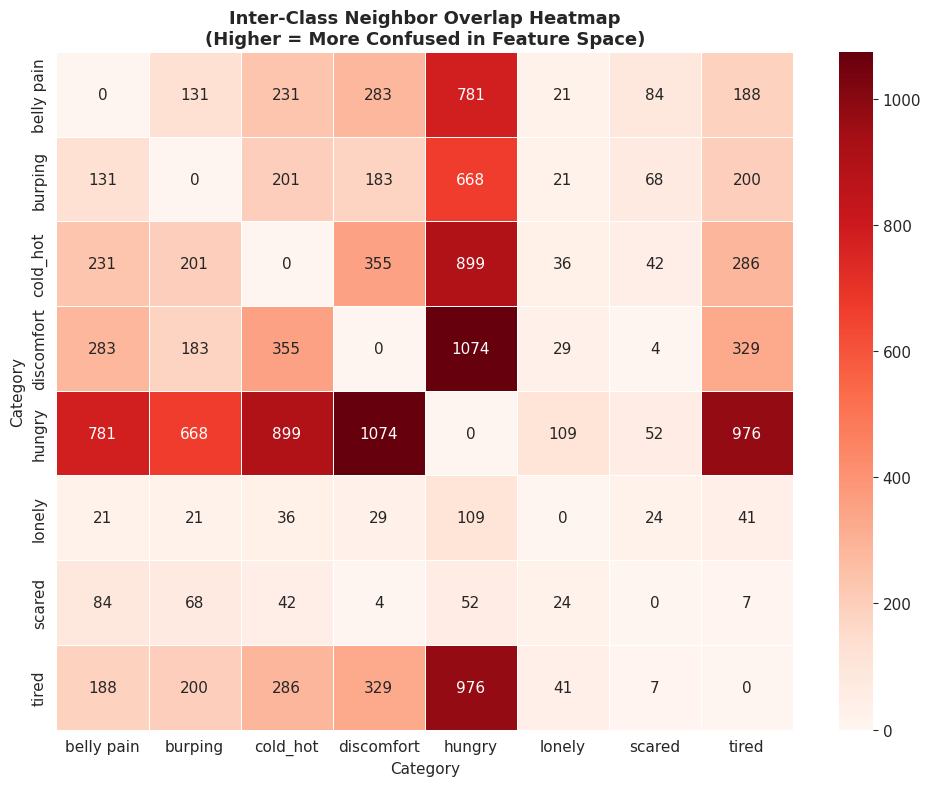

In [189]:
# Heatmap of inter-class confusion based on neighbor overlap
all_cats = sorted(df_features['category'].unique())
confusion_matrix_nn = pd.DataFrame(0, index=all_cats, columns=all_cats)

for _, row in df_confusion.iterrows():
    confusion_matrix_nn.loc[row['class_a'], row['class_b']] = row['neighbor_overlaps']
    confusion_matrix_nn.loc[row['class_b'], row['class_a']] = row['neighbor_overlaps']

plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_matrix_nn, annot=True, fmt='d', cmap='Reds',
    linewidths=0.5, linecolor='white'
)
plt.title('Inter-Class Neighbor Overlap Heatmap\n(Higher = More Confused in Feature Space)',
          fontsize=13, fontweight='bold')
plt.xlabel('Category')
plt.ylabel('Category')
plt.tight_layout()
plt.show()

### 15.6 Interpretation and Modeling Implications

**PCA Finding:**
The first two principal components capture only approximately 38.6%
of total variance. This means:

- The feature space has high intrinsic dimensionality. The data
  cannot be meaningfully compressed into 2 or 3 dimensions.
- Approximately 23 components are needed for 95% variance retention.
- Linear separability is poor. A linear classifier (Logistic
  Regression, linear SVM) operating on averaged MFCC features
  will likely struggle to achieve high accuracy.

**t-SNE Finding:**
The t-SNE plot shows the degree of local cluster formation.
Classes with high purity scores form visible clusters. Classes
with low purity scores are scattered among other classes and
will be the primary source of classification errors.

**Most Confused Pairs:**
The neighbor overlap analysis identifies which specific class
pairs are hardest to separate. These pairs should be the focus
of error analysis after model training. If the trained model
confuses the same pairs identified here, the errors stem from
genuine acoustic similarity rather than model weakness.

**Why This Justifies CNN Over Traditional ML:**
A CNN operating on Mel spectrogram images can learn hierarchical
spatial features: low-level frequency patterns, harmonic structures,
temporal onset patterns, and spectral envelope shapes. These
spatially localized patterns are destroyed when features are
averaged over time (as in the mean MFCC approach used here).
The poor linear separability in averaged-feature space does not
mean the classes are inseparable. It means a representation that
preserves spatial and temporal structure (spectrograms) combined
with a model that exploits spatial patterns (CNN) is needed.

## 16. Outlier Detection

Use the IQR method to detect outliers in key audio features.

In [190]:
outlier_cols = ['duration_sec', 'rms_mean', 'zcr_mean',
                'spectral_centroid_mean', 'spectral_bandwidth_mean']

print("OUTLIER DETECTION (IQR Method)")
print("=" * 60)

outlier_summary = []

for col in outlier_cols:
    Q1 = df_features[col].quantile(0.25)
    Q3 = df_features[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = df_features[(df_features[col] < lower) | (df_features[col] > upper)]
    n_outliers = len(outliers)
    pct = n_outliers / len(df_features) * 100
    outlier_summary.append({
        'feature': col,
        'n_outliers': n_outliers,
        'pct': round(pct, 1),
        'lower_bound': round(lower, 4),
        'upper_bound': round(upper, 4)
    })
    print(f"\n{col}:")
    print(f"  IQR range: [{lower:.4f}, {upper:.4f}]")
    print(f"  Outliers: {n_outliers} ({pct:.1f}%)")
    if n_outliers > 0:
        cat_dist = outliers['category'].value_counts()
        for cat, cnt in cat_dist.items():
            print(f"    - {cat}: {cnt}")

print("\n")
df_outlier_summary = pd.DataFrame(outlier_summary)
print(df_outlier_summary.to_string(index=False))

OUTLIER DETECTION (IQR Method)

duration_sec:
  IQR range: [6.6000, 7.2400]
  Outliers: 104 (9.2%)
    - belly pain: 42
    - burping: 35
    - scared: 12
    - cold_hot: 9
    - hungry: 3
    - tired: 3

rms_mean:
  IQR range: [-0.1050, 0.2330]
  Outliers: 17 (1.5%)
    - discomfort: 6
    - hungry: 5
    - tired: 3
    - burping: 2
    - belly pain: 1

zcr_mean:
  IQR range: [0.0109, 0.1920]
  Outliers: 28 (2.5%)
    - burping: 8
    - scared: 7
    - cold_hot: 5
    - hungry: 3
    - belly pain: 2
    - discomfort: 2
    - tired: 1

spectral_centroid_mean:
  IQR range: [602.6297, 2177.3417]
  Outliers: 67 (6.0%)
    - belly pain: 41
    - scared: 12
    - burping: 6
    - cold_hot: 6
    - discomfort: 1
    - hungry: 1

spectral_bandwidth_mean:
  IQR range: [631.8937, 1163.2744]
  Outliers: 117 (10.4%)
    - belly pain: 41
    - burping: 34
    - scared: 15
    - cold_hot: 9
    - hungry: 7
    - lonely: 5
    - discomfort: 4
    - tired: 2


                feature  n_outliers  pct

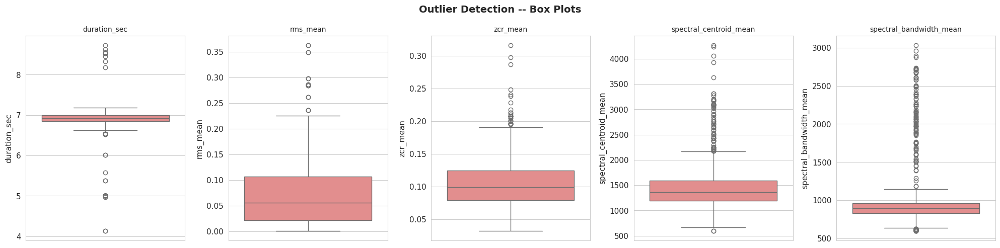

In [191]:
# Visualize outliers
fig, axes = plt.subplots(1, len(outlier_cols), figsize=(4 * len(outlier_cols), 5))
for i, col in enumerate(outlier_cols):
    sns.boxplot(data=df_features, y=col, ax=axes[i], color='lightcoral')
    axes[i].set_title(col, fontsize=10)

plt.suptitle('Outlier Detection -- Box Plots', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 17. Feature Importance Estimation

Use ANOVA F-statistic to rank which features are most useful for
distinguishing between the 8 categories.

In [192]:
from sklearn.feature_selection import f_classif

X_for_anova = df_features[feature_cols_full].values
X_for_anova = np.nan_to_num(X_for_anova, nan=0.0, posinf=0.0, neginf=0.0)
y_for_anova = le.fit_transform(df_features['category'].values)

f_scores, p_values = f_classif(X_for_anova, y_for_anova)

df_importance = pd.DataFrame({
    'feature': feature_cols_full,
    'f_score': f_scores,
    'p_value': p_values
}).sort_values('f_score', ascending=False)

print("Top 20 Features by ANOVA F-Score:")
print("=" * 55)
print(df_importance.head(20).to_string(index=False))

Top 20 Features by ANOVA F-Score:
                feature   f_score      p_value
  spectral_contrast_std 40.357945 8.426022e-51
spectral_bandwidth_mean 38.456960 1.591089e-48
  spectral_rolloff_mean 32.830038 1.136688e-41
 spectral_centroid_mean 30.401344 1.170692e-38
           duration_sec 30.159064 2.348562e-38
   spectral_rolloff_std 26.346074 1.487454e-33
 spectral_bandwidth_std 25.507202 1.736347e-32
  spectral_centroid_std 19.857710 3.349652e-25
            mfcc_1_mean 17.542174 3.608899e-22
            mfcc_4_mean 15.553885 1.512990e-19
            mfcc_0_mean 12.971335 4.042230e-16
               zcr_mean 12.056479 6.673883e-15
            mfcc_11_std 11.580592 2.872480e-14
            mfcc_10_std 10.593772 5.928973e-13
            mfcc_12_std  7.978484 1.772641e-09
 spectral_contrast_mean  7.710585 4.006750e-09
           mfcc_11_mean  7.296846 1.407942e-08
            mfcc_5_mean  7.247068 1.637350e-08
             mfcc_1_std  7.042577 3.042125e-08
                zcr_std  7

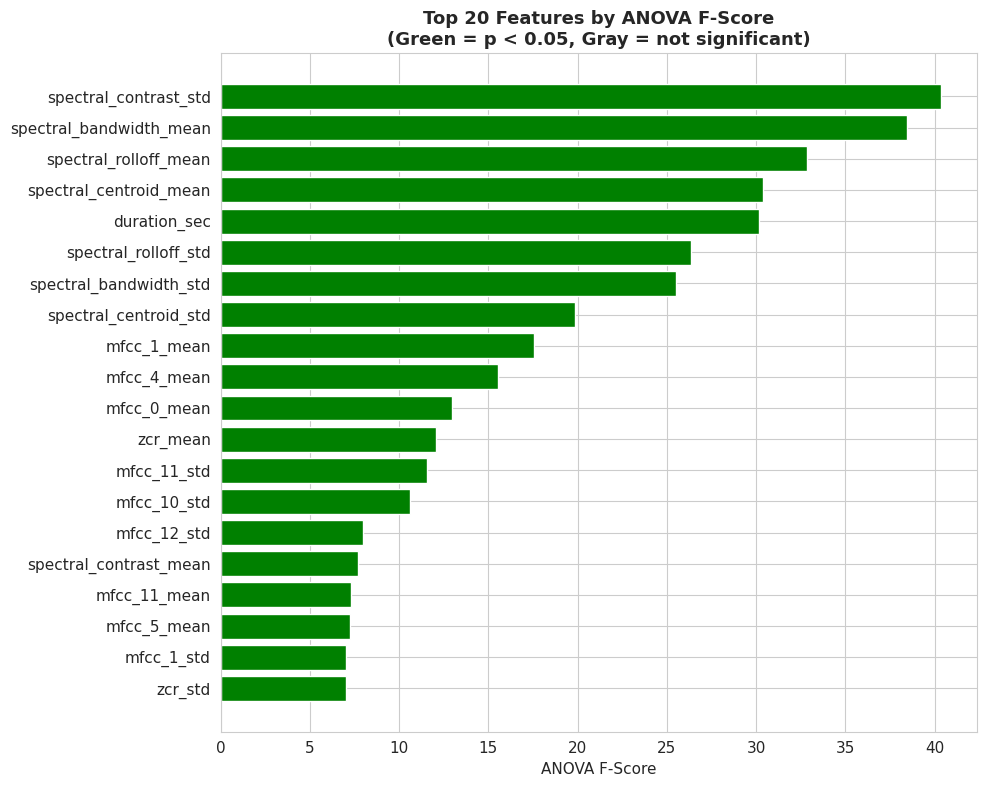

In [193]:
# Plot top 20 features
top_n = 20
df_top = df_importance.head(top_n).sort_values('f_score', ascending=True)

plt.figure(figsize=(10, 8))
colors = ['green' if p < 0.05 else 'gray' for p in df_top['p_value']]
plt.barh(df_top['feature'], df_top['f_score'], color=colors)
plt.xlabel('ANOVA F-Score')
plt.title(f'Top {top_n} Features by ANOVA F-Score\n(Green = p < 0.05, Gray = not significant)',
          fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

## 18. Pairwise Feature Scatter Plots

Examine relationships between the top discriminating features.

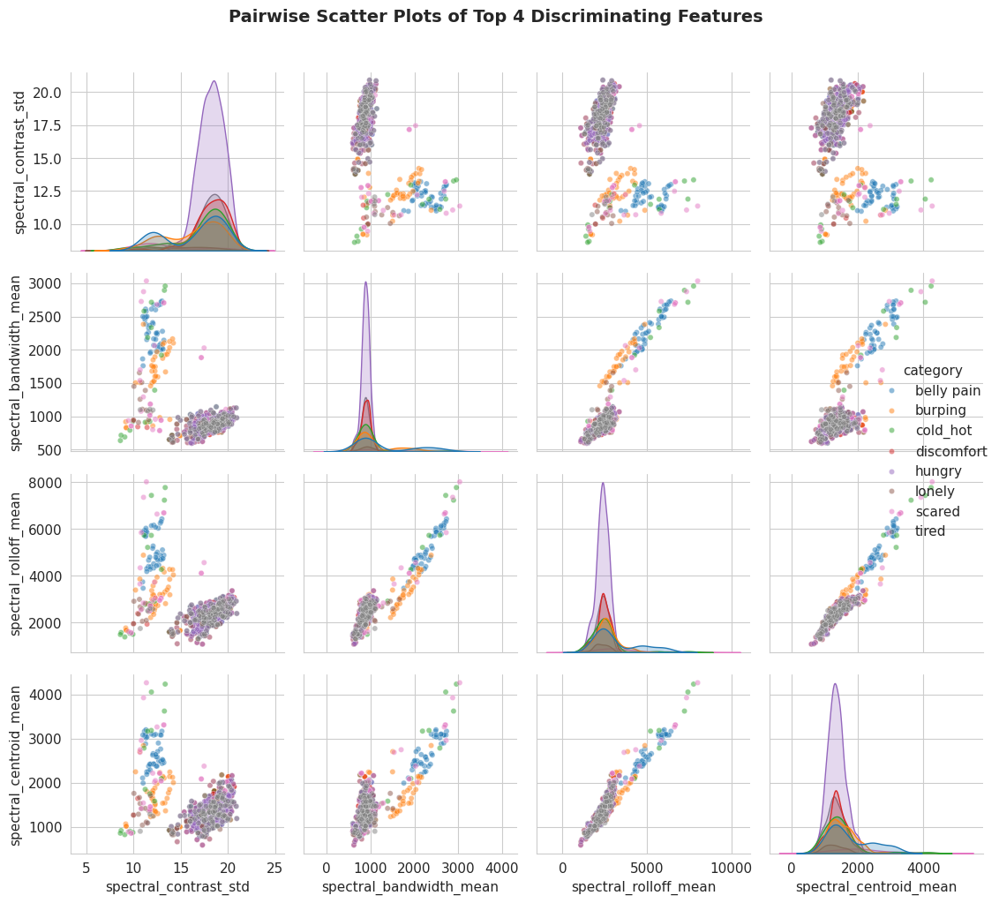

In [194]:
top_4_features = df_importance.head(4)['feature'].tolist()

plot_df = df_features[top_4_features + ['category']].copy()

g = sns.pairplot(plot_df, hue='category', palette='tab10',
                 diag_kind='kde', plot_kws={'alpha': 0.5, 's': 20})
g.figure.suptitle('Pairwise Scatter Plots of Top 4 Discriminating Features',
                  fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 19. Audio Playback Samples

Listen to one sample from each category (works in Jupyter notebooks).

In [195]:
print("Audio Samples from Each Category")
print("=" * 50)

for cat in categories:
    sample_path = df_meta[df_meta['category'] == cat]['file_path'].values[0]
    sample_name = df_meta[df_meta['category'] == cat]['file_name'].values[0]
    print(f"\nCategory: {cat}")
    print(f"File: {sample_name}")
    display(ipd.Audio(sample_path))

Audio Samples from Each Category

Category: belly pain
File: 382c.wav



Category: burping
File: 493c.wav



Category: cold_hot
File: 1c.wav



Category: discomfort
File: 204c.wav



Category: hungry
File: 177dc72e-d0f8-47ef-a5a7-3b46878e11a0-1430736358754-1.7-f-26-hu.wav



Category: lonely
File: lo-12 - Copy.3gp



Category: scared
File: generated3_5f651112-d2a3-4911-b3a5-f37bfc092494-1430734603484-1.7-m-72-sc.wav



Category: tired
File: 328c.wav


## 20. File Size Analysis

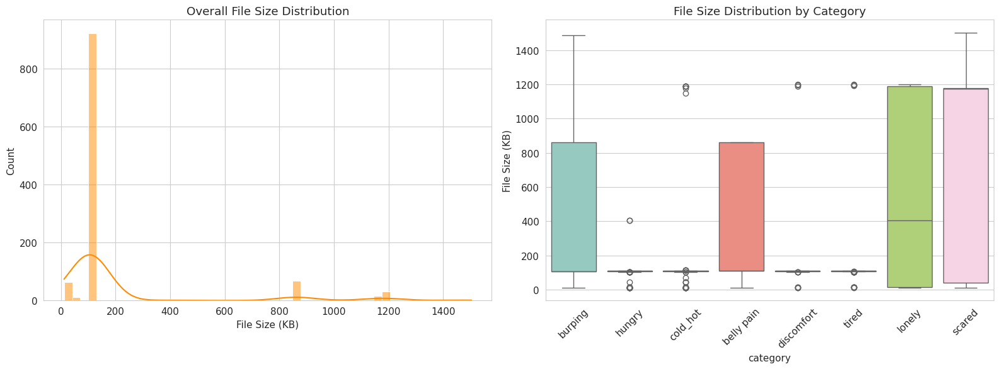

In [196]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# File size distribution
sns.histplot(df_meta['file_size_KB'], bins=50, kde=True, color='darkorange', ax=axes[0])
axes[0].set_title('Overall File Size Distribution')
axes[0].set_xlabel('File Size (KB)')
axes[0].set_ylabel('Count')

# File size per category
order = df_meta.groupby('category')['file_size_KB'].median().sort_values().index
sns.boxplot(data=df_meta, x='category', y='file_size_KB',
            palette='Set3', order=order, ax=axes[1])
axes[1].set_title('File Size Distribution by Category')
axes[1].tick_params(axis='x', rotation=45)
axes[1].set_ylabel('File Size (KB)')

plt.tight_layout()
plt.show()

## 21. Summary and Key Findings

In [197]:
print("=" * 70)
print("SUMMARY OF EXPLORATORY DATA ANALYSIS")
print("=" * 70)

print(f"""
1. DATASET SIZE
   - Total files: {len(df_meta)}
   - Total size: {df_meta['file_size_KB'].sum() / 1024:.2f} MB
   - Categories: {len(categories)}

2. CLASS IMBALANCE
   - Largest class: {max_class} ({category_counts.max()} files, {category_counts.max()/len(df_meta)*100:.1f}%)
   - Smallest class: {min_class} ({category_counts.min()} files, {category_counts.min()/len(df_meta)*100:.1f}%)
   - Imbalance ratio: {imbalance_ratio:.1f}:1
   - Recommendation: Use class weights, oversampling, or data augmentation

3. AUDIO PROPERTIES
   - Sample rates found: {sorted(df_audio['sample_rate'].unique())}
   - Duration range: {df_audio['duration_sec'].min():.2f}s to {df_audio['duration_sec'].max():.2f}s
   - Mean duration: {df_audio['duration_sec'].mean():.2f}s
   - Recommendation: Standardize sample rate to 22050 Hz before training

4. FILE FORMATS
   - Dominant format: .wav ({format_counts.get('.wav', 0)} files)
   - Other formats present: {', '.join([f for f in format_counts.index if f != '.wav'])}
   - Recommendation: Convert all files to .wav for consistency

5. FEATURE SEPARABILITY
   - PCA shows {sum(pca.explained_variance_ratio_[:2]):.1%} variance in first 2 components
   - Components needed for 95% variance: {n_95}
   - t-SNE visualization indicates the degree of cluster separation

6. DATA QUALITY
   - Failed to load: {len(failed_files)} files
   - Potentially empty files (< 1KB): {len(empty_files)}

7. RECOMMENDATIONS FOR MODELING
   - Address class imbalance (especially lonely: {category_counts.get('lonely', 'N/A')} and scared: {category_counts.get('scared', 'N/A')} files)
   - Consider audio augmentation: time stretching, pitch shifting, adding noise
   - Mel spectrograms or MFCCs are suitable input representations
   - CNN, LSTM, or hybrid architectures are appropriate model choices
   - Use stratified train/test splits to preserve class proportions
""")

print("=" * 70)
print("END OF EXPLORATORY DATA ANALYSIS")
print("=" * 70)

SUMMARY OF EXPLORATORY DATA ANALYSIS

1. DATASET SIZE
   - Total files: 1126
   - Total size: 223.75 MB
   - Categories: 8

2. CLASS IMBALANCE
   - Largest class: hungry (397 files, 35.3%)
   - Smallest class: lonely (25 files, 2.2%)
   - Imbalance ratio: 15.9:1
   - Recommendation: Use class weights, oversampling, or data augmentation

3. AUDIO PROPERTIES
   - Sample rates found: [np.int64(8000), np.int64(44100)]
   - Duration range: 4.13s to 8.73s
   - Mean duration: 6.78s
   - Recommendation: Standardize sample rate to 22050 Hz before training

4. FILE FORMATS
   - Dominant format: .wav (1039 files)
   - Other formats present: .3gp, .ogg, .mp3
   - Recommendation: Convert all files to .wav for consistency

5. FEATURE SEPARABILITY
   - PCA shows 38.6% variance in first 2 components
   - Components needed for 95% variance: 23
   - t-SNE visualization indicates the degree of cluster separation

6. DATA QUALITY
   - Failed to load: 0 files
   - Potentially empty files (< 1KB): 0

7. REC